In [260]:
import scipy.io as sio
import scipy.stats as stats
from scipy import spatial
import copy
import matplotlib.pyplot as plt
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.integrate import odeint
from copy import deepcopy
#from mpl_toolkits.axisartist.parasite_axes import HostAxes, ParasiteAxes
import seaborn as sns
import networkx as nx
from itertools import combinations
from itertools import permutations
import random
from scipy.spatial import distance

In [31]:
def H_solver(list1, list2):
    size_1 = math.sqrt(np.sum(np.power(list1, 2)))
    updated_list1 = [x / size_1 for x in list1]
    size_2 = math.sqrt(np.sum(np.power(list2, 2)))
    updated_list2 = [x / size_2 for x in list2]
    h_list = [a*b for a,b in zip(updated_list1,updated_list2)]
    return np.sum(h_list)

In [248]:
k_forward = 0.01
k_backword = 0.0001
Ng = 100
rho = 1/Ng

def flux_calculation(df_beta_matrix, composition):
    overall_flux = []
    for lipid_type in df_beta_matrix.columns:
#         print(lipid_type)
#         print(composition[lipid_type])
        beta_calc_vector = [a*b/(sum(composition)) for a,b in zip(list(df_beta_matrix.iloc[lipid_type,:]), composition)]
        lipid_flux = ((k_forward*rho*sum(composition)) - (k_backword*composition[lipid_type])) * (1+sum(beta_calc_vector))
        overall_flux.append(lipid_flux)
    return overall_flux

In [33]:
def nmol_transform(compotype):
    nmol = []
    for val in compotype:
        if val >= 1:
            nmol.append(1)
        else:
            nmol.append(0)
    return nmol

In [34]:
def cycles_identifier(available_interactions):
    G = nx.DiGraph()
#     print(available_interactions)
    nodes = []
    for interaction in available_interactions:
        for num in interaction:
            nodes.append(num)
    nodes = list(set(nodes))
    G.add_nodes_from(nodes)
    G.add_edges_from(available_interactions)
#     print(G)
    cycles = list(nx.simple_cycles(G))
    return cycles

In [35]:
def network_builder(available_interactions):
    G = nx.DiGraph()
#     print(available_interactions)
    nodes = []
    for interaction in available_interactions:
        for num in interaction:
            nodes.append(num)
    nodes = list(set(nodes))
    G.add_nodes_from(nodes)
    G.add_edges_from(available_interactions)
    return G

In [36]:
def motifs_finder(beta_matrix, compotype_bool):
    available_interactions = []
    steps = 175  #max is beta_matrix.shape[0]*beta_matrix.shape[1]
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    beta_matrix_mod = deepcopy(beta_matrix)
    all_identified_cycles = []
    compotype_cycles_fraction = []
    cycle_sizes = []
    cycle_size_threshold = 10
    
    while len(all_identified_cycles) < cycles_amount_threshold:
        max_val = beta_matrix_mod.max(axis=0).max()
        max_val_column = int(beta_matrix_mod.max(axis=0).idxmax())
        max_val_row = int(beta_matrix_mod.max(axis=1).idxmax())
        interaction = (max_val_column,max_val_row)
        available_interactions.append(interaction)
        all_identified_cycles = cycles_identifier(available_interactions)
        beta_matrix_mod.iloc[max_val_row,max_val_column] = 0
        
    for cycle in all_identified_cycles:
        counter_comp = 0
        for node in cycle:
            if node in nmol_idxs:
                counter_comp += 1
        fraction = counter_comp / len(cycle)
        compotype_cycles_fraction.append(fraction)
        cycle_sizes.append(len(cycle))

    return compotype_cycles_fraction, cycle_sizes

########## Beta 1
########## Beta 2
########## Beta 6
########## Beta 8
########## Beta 13
########## Beta 15
########## Beta 18
########## Beta 19
########## Beta 21
########## Beta 22
########## Beta 26


<ipython-input-37-175c36d0d903>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,8))


########## Beta 27
########## Beta 29
########## Beta 30
########## Beta 31
########## Beta 34
########## Beta 35
########## Beta 36
########## Beta 38
########## Beta 39
########## Beta 40
########## Beta 43
########## Beta 44
########## Beta 46
########## Beta 49
########## Beta 50
########## Beta 51
########## Beta 53
########## Beta 56
########## Beta 57
########## Beta 58
########## Beta 64
########## Beta 66
########## Beta 69
########## Beta 80
########## Beta 82
########## Beta 84
########## Beta 87
########## Beta 89
########## Beta 91
########## Beta 92
########## Beta 93
########## Beta 96
########## Beta 97
########## Beta 98
########## Beta 100


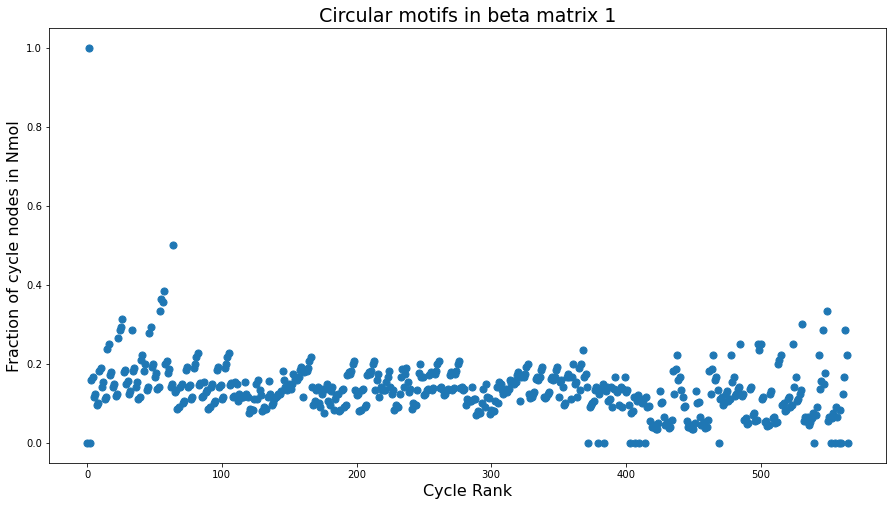

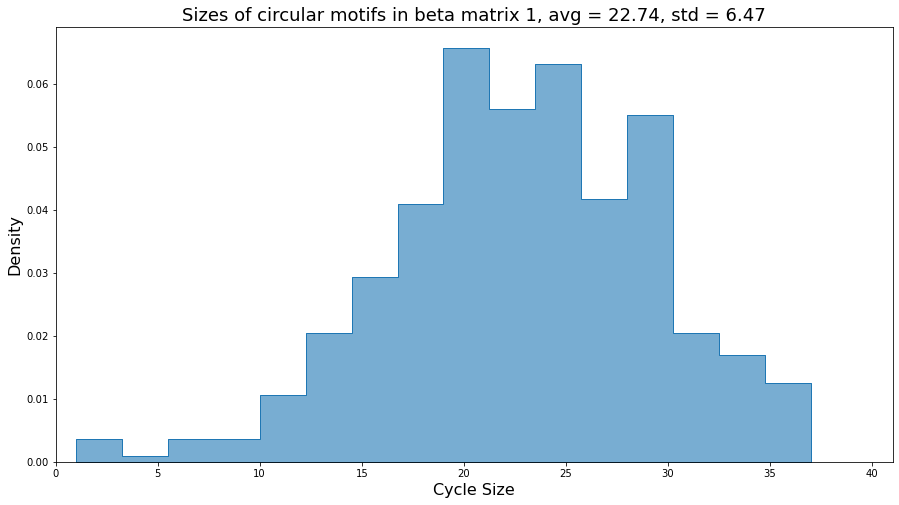

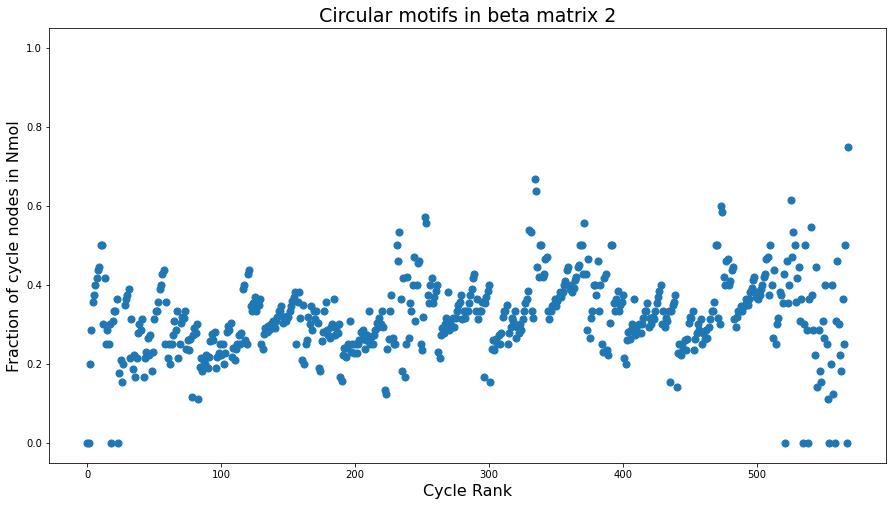

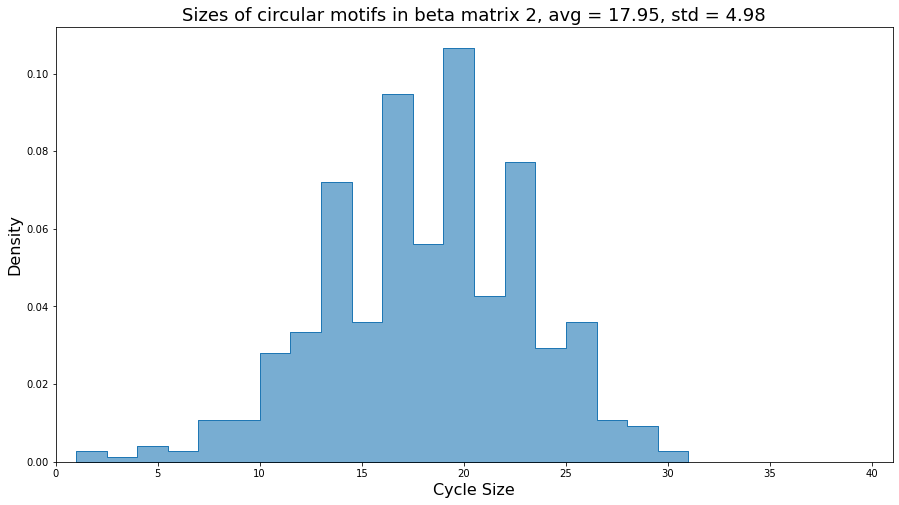

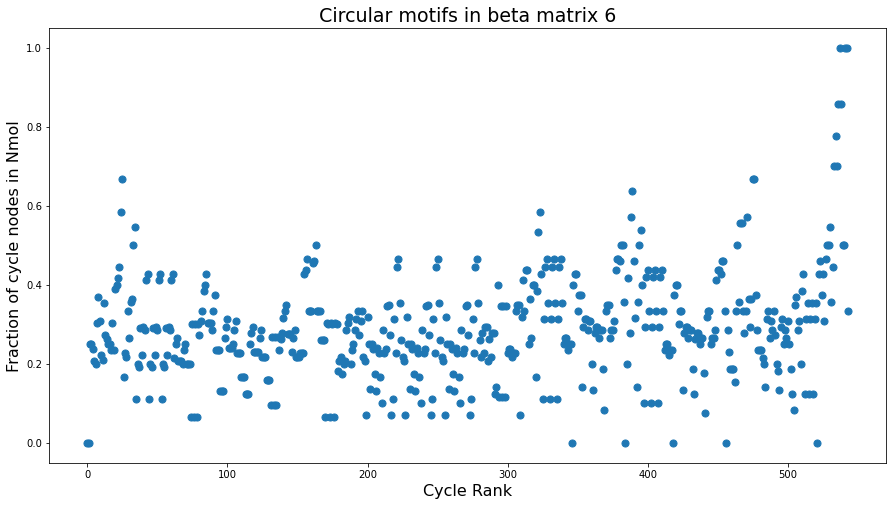

...

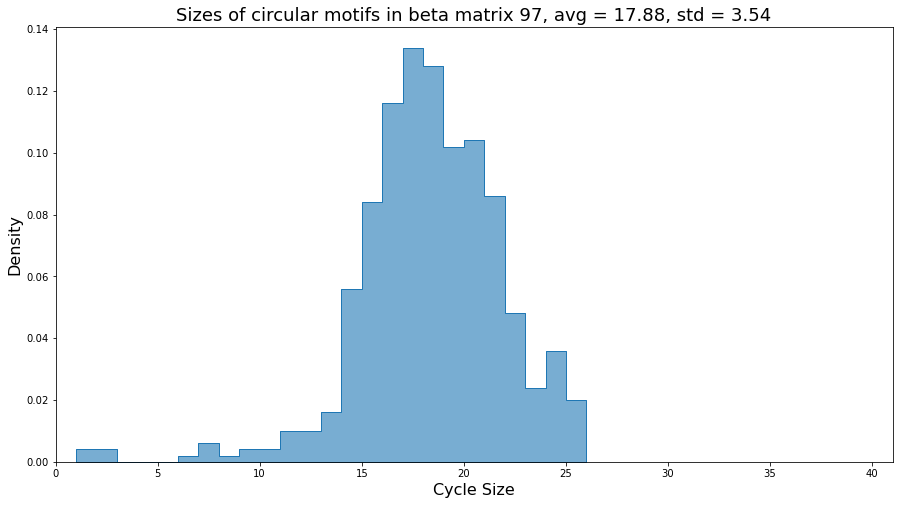

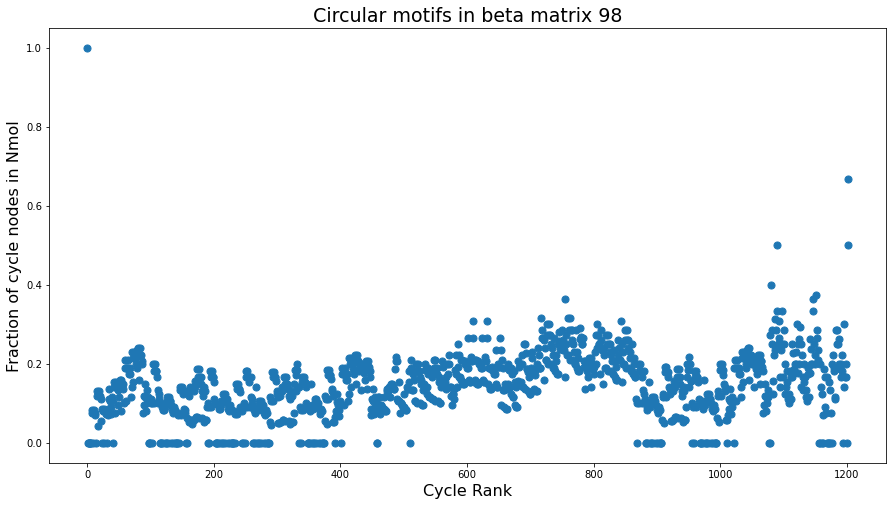

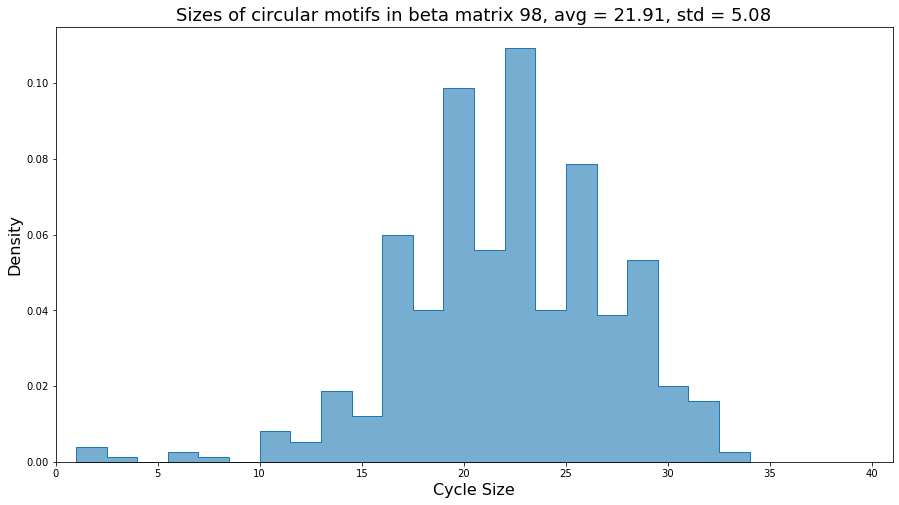

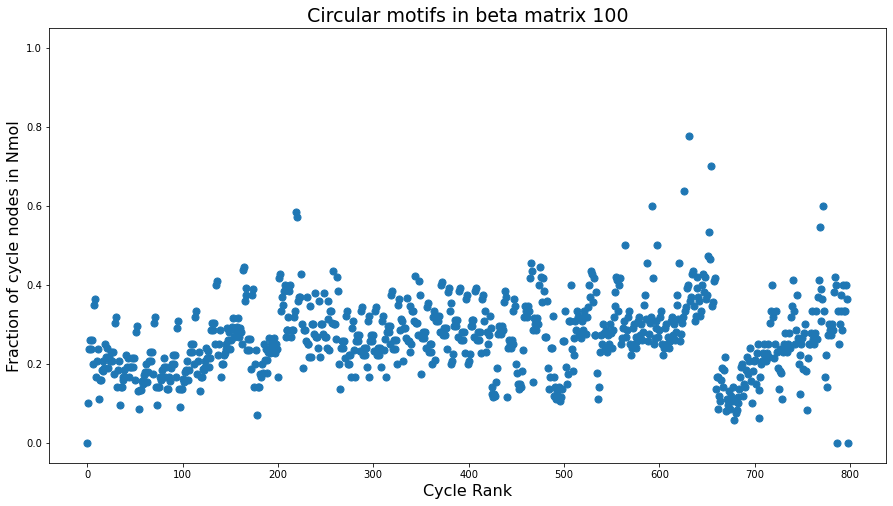

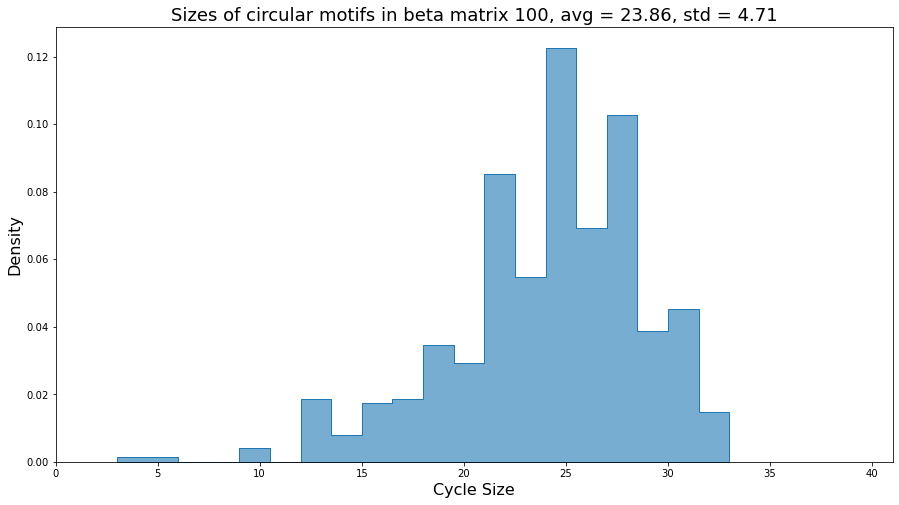

In [37]:
cycles_amount_threshold = 500
betas = [1,2,6,8,13,15,18,19,21,22,26,27,29,30,31,34,35,36,38,39,40,43,44,46,49,50,51,53,56,57,58,64,66,69,80,82,84,87,89,91,92,93,96,97,98,100]
df_compotypes = pd.read_csv('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Compotype_Database_singles_18Sep20.csv')

for beta in betas:
    print('########## Beta ' + str(beta))
    df_beta_matrix = pd.read_csv('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Beta ' + str(beta) + '\\df_beta_matrix.csv')
    compotype_bool = nmol_transform(list(df_compotypes[str(beta)]))
    compotype_cycles_fraction, cycle_sizes = motifs_finder(df_beta_matrix,compotype_bool)
#     compotype_cycles_vals = [0]*len(compotype_cycles)
#     non_compotype_cycles_vals = [0]*len(non_compotype_cycles)
    
    plt.figure(figsize=(15,8))
    plt.scatter(range(len(compotype_cycles_fraction)),compotype_cycles_fraction, s=50)
    plt.ylim(-0.05,1.05)
    plt.xlabel('Cycle Rank',fontsize=16)
    plt.ylabel('Fraction of cycle nodes in Nmol',fontsize=16)
#     plt.ylabel('Cycle Association',fontsize=16)
    plt.title('Circular motifs in beta matrix ' + str(beta), fontsize=19)
    
    
    plt.figure(figsize=(15,8))
    sns.histplot(cycle_sizes[:cycles_amount_threshold], stat="density", alpha=0.6, element="step")
    avg_cycle_size = np.mean(np.array(cycle_sizes[:cycles_amount_threshold]))
    std_cycle_size = np.std(np.array(cycle_sizes[:cycles_amount_threshold]))
    plt.title("Sizes of circular motifs in beta matrix " + str(beta) + ", avg = " + "{:.2f}".format(avg_cycle_size) + ", std = " + "{:.2f}".format(std_cycle_size), fontsize=18)
    plt.xlabel("Cycle Size", fontsize=16)
    plt.ylabel("Density", fontsize=16)
    plt.xlim(0,41)


########## Beta 1
########## Beta 2
########## Beta 6
########## Beta 8
########## Beta 13
########## Beta 15
########## Beta 18
########## Beta 19
########## Beta 21
########## Beta 22
########## Beta 26
########## Beta 27
########## Beta 29
########## Beta 30
########## Beta 31
########## Beta 34
########## Beta 35
########## Beta 36
########## Beta 38
########## Beta 39
########## Beta 40


<ipython-input-38-81d855cd779a>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,8))


########## Beta 43
########## Beta 44
########## Beta 46
########## Beta 49
########## Beta 50
########## Beta 51
########## Beta 53
########## Beta 56
########## Beta 57
########## Beta 58
########## Beta 64
########## Beta 66
########## Beta 69
########## Beta 80
########## Beta 82
########## Beta 84
########## Beta 87
########## Beta 89
########## Beta 91
########## Beta 92
########## Beta 93
########## Beta 96
########## Beta 97
########## Beta 98
########## Beta 100


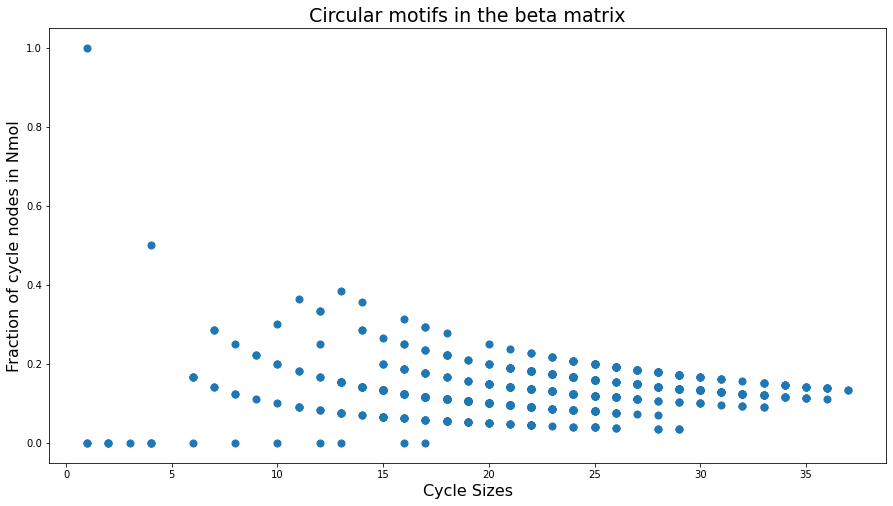

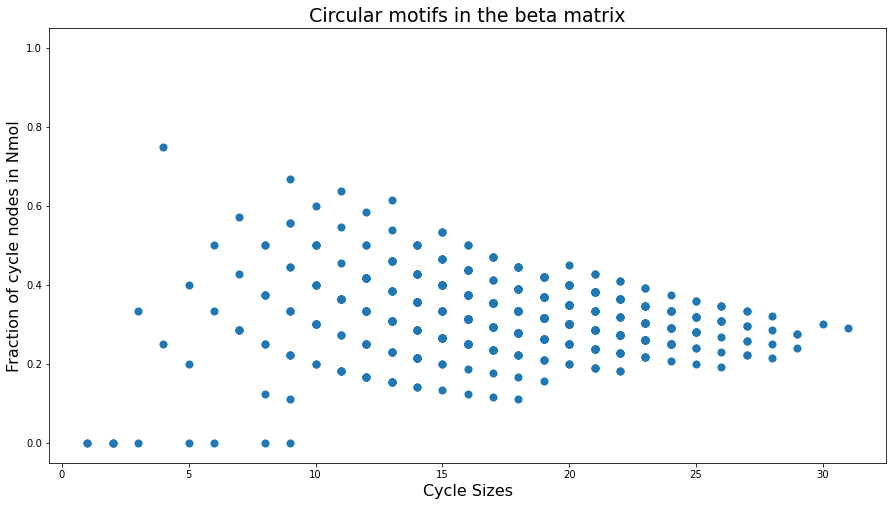

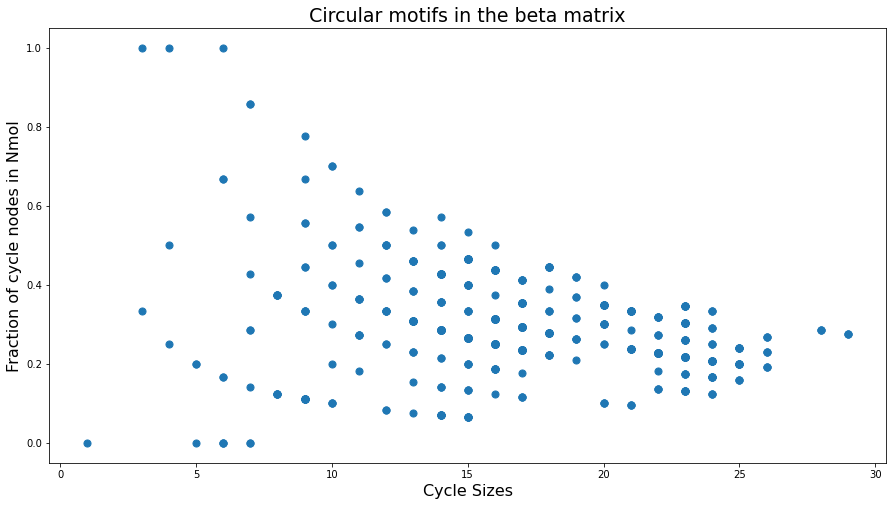

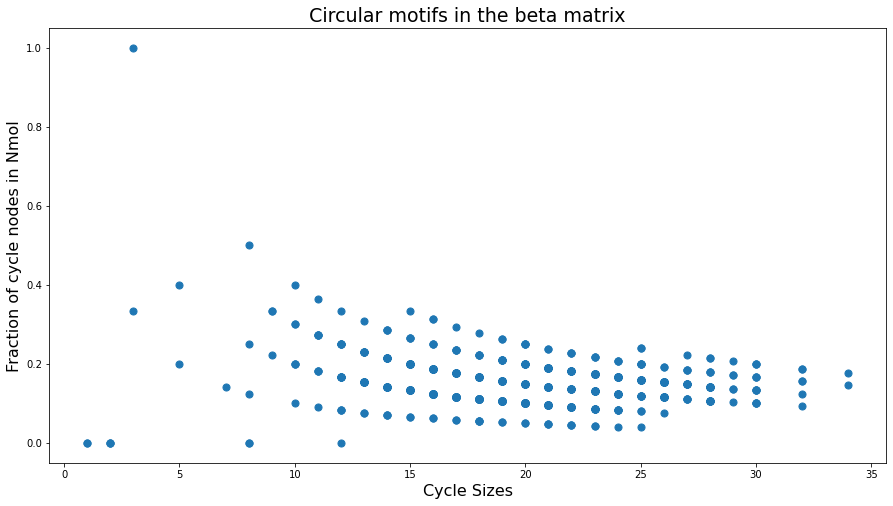

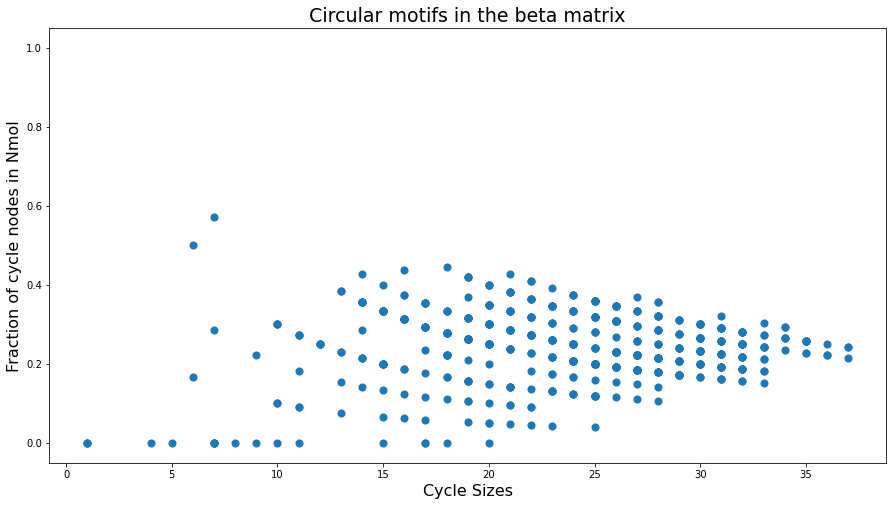

...

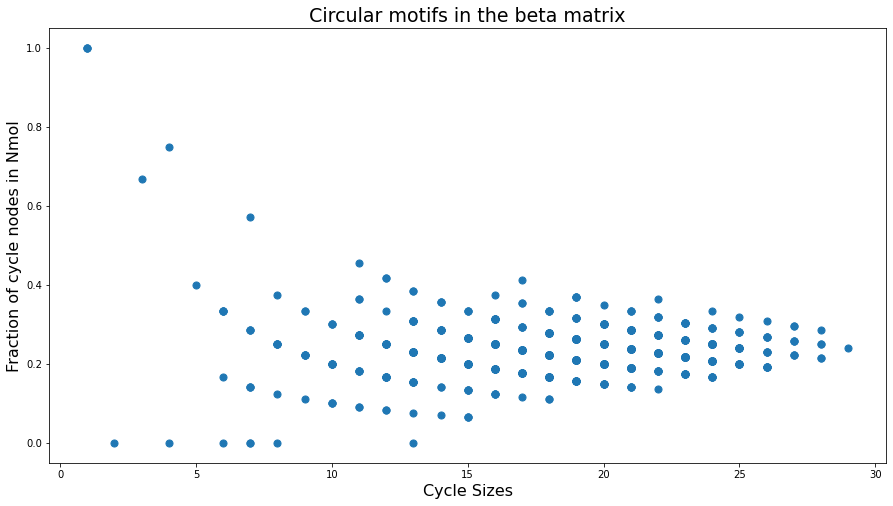

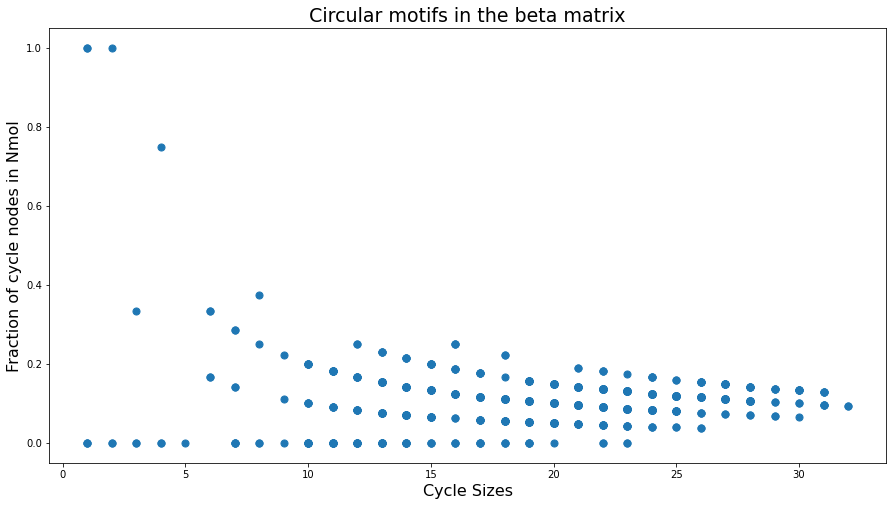

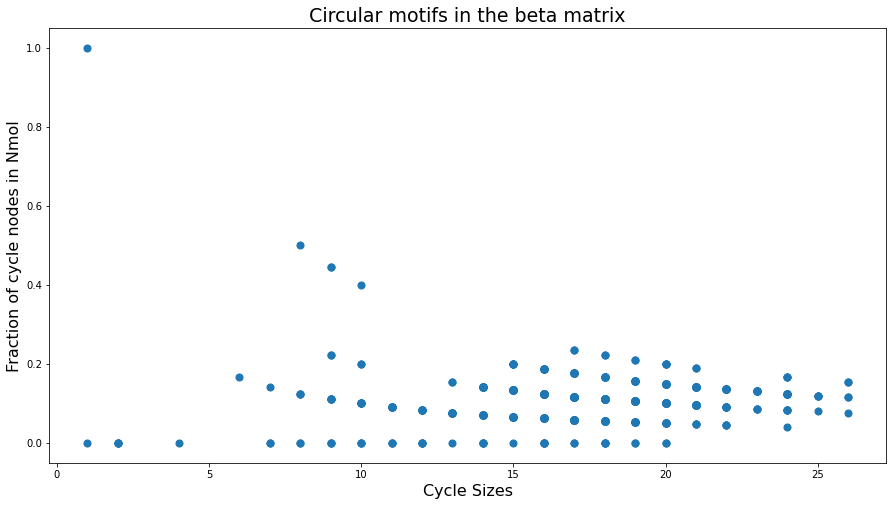

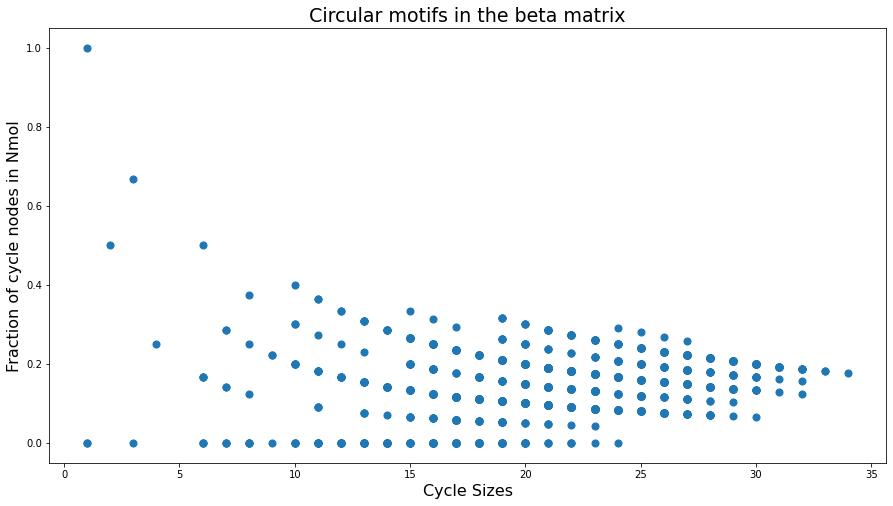

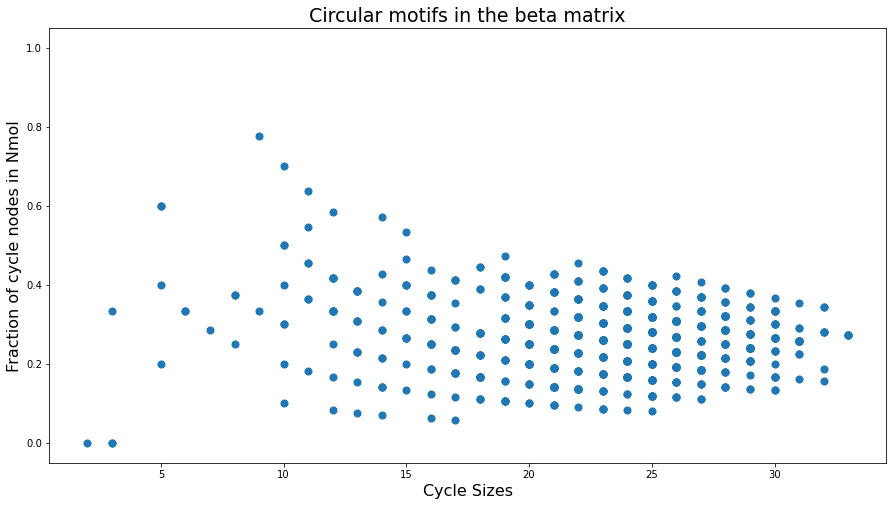

In [38]:
betas = [1,2,6,8,13,15,18,19,21,22,26,27,29,30,31,34,35,36,38,39,40,43,44,46,49,50,51,53,56,57,58,64,66,69,80,82,84,87,89,91,92,93,96,97,98,100]
df_compotypes = pd.read_csv('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Compotype_Database_singles_18Sep20.csv')

for beta in betas:
    print('########## Beta ' + str(beta))
    df_beta_matrix = pd.read_csv('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Beta ' + str(beta) + '\\df_beta_matrix.csv')
    compotype_bool = nmol_transform(list(df_compotypes[str(beta)]))
    compotype_cycles_fraction, cycle_sizes = motifs_finder(df_beta_matrix,compotype_bool)
#     compotype_cycles_vals = [0]*len(compotype_cycles)
#     non_compotype_cycles_vals = [0]*len(non_compotype_cycles)
    
    plt.figure(figsize=(15,8))
    plt.scatter(cycle_sizes,compotype_cycles_fraction, s=50)
    plt.ylim(-0.05,1.05)
    plt.xlabel('Cycle Sizes',fontsize=16)
    plt.ylabel('Fraction of cycle nodes in Nmol',fontsize=16)
#     plt.ylabel('Cycle Association',fontsize=16)
    plt.title('Circular motifs in the beta matrix', fontsize=19)

In [39]:
# '''Let's try to go with a loose definition of autocatalytic core as a core of catalytic interactions that promotes itself within the network'''
# for beta in betas:
#     print('########## Beta ' + str(beta))
#     df_beta_matrix = pd.read_csv('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor GARD in messy environment\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Beta ' + str(beta) + '\\df_beta_matrix.csv')
#     compotype_bool = nmol_transform(list(df_compotypes[str(beta)]))
#     nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
#     df_beta_matrix_mod = df_beta_matrix.iloc[nmol_idxs,nmol_idxs]
#     avg_catal = (df_beta_matrix_mod.sum().sum())/(df_beta_matrix_mod.shape[0]*df_beta_matrix_mod.shape[1])
#     print("Compotype: size - " + str(sum(compotype_bool)) + ", average catalysis - " + str(avg_catal))
# #     catal_dict = {}
# #     lipids_poten = list(range(df_beta_matrix.shape[0]))
# #     for lipid_amount in range(1,df_beta_matrix.shape[0]+1):
# #         print(lipid_amount)
# #         combs = combinations(lipids_poten, lipid_amount)
# #         for comb in combs:
# #             df_beta_matrix_mod = df_beta_matrix.iloc[list(comb),list(comb)]
# #             avg_catal = (df_beta_matrix_mod.sum().sum())/(df_beta_matrix_mod.shape[0]*df_beta_matrix_mod.shape[1])
# #             catal_dict[comb] = avg_catal
            
# #     best_match = min(d, key=d.get)
# #     print(best_match, nmol_idxs)

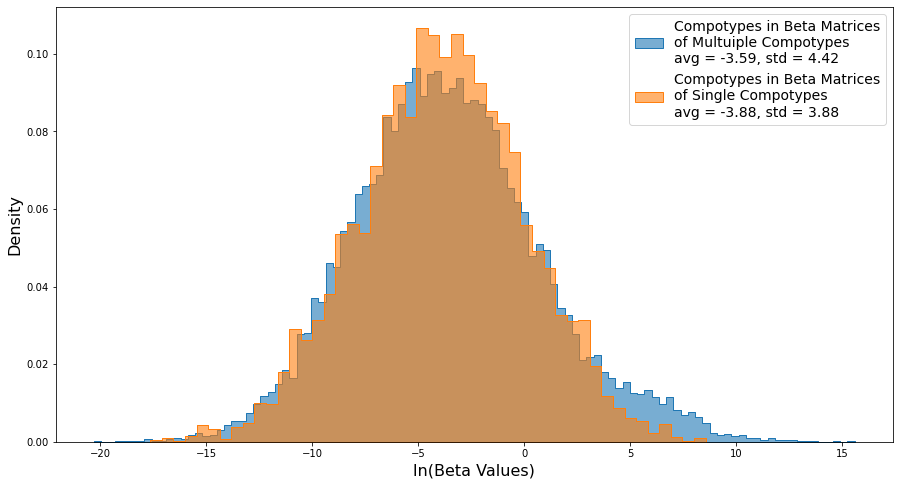

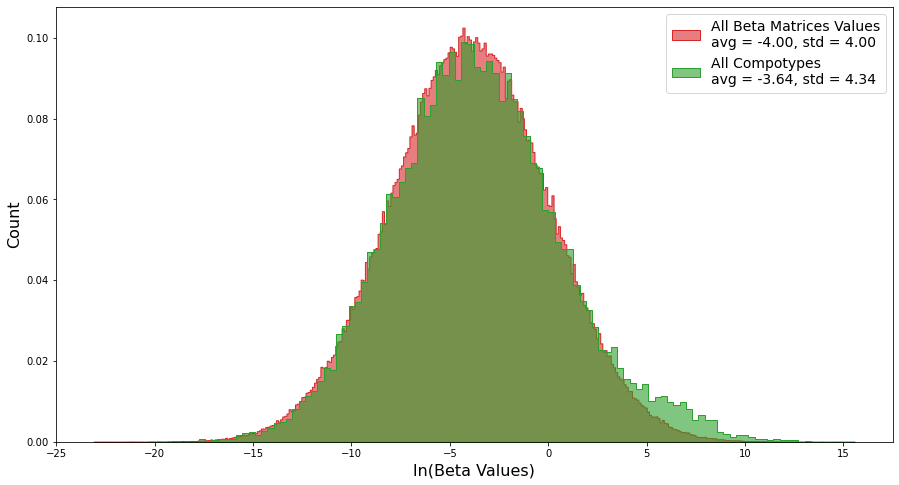

In [188]:
current_palette = list(sns.color_palette())

'''Betas of multiple compotypes'''
df_multiple_compotypes = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\Multiple Compotypes database.csv")
multiple_comptypes_values_list = []
for column in df_multiple_compotypes.columns:
    if "." in column:
        column_mod = column.split(".")[0]
    else:
        column_mod = column
    df_beta_matrix = df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(column_mod) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_multiple_compotypes.loc[:,column]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    for lipid_id in nmol_idxs:
        values_by_lipid_id = [df_beta_matrix.iloc[lipid_id,x] for x in nmol_idxs]
        multiple_comptypes_values_list.extend(values_by_lipid_id)
    

# multiple_comptypes_values_list_temp = df_multiple_compotypes.values.tolist()
# multiple_comptypes_values_list = []
# for temp_list in multiple_comptypes_values_list_temp:
#     for val in temp_list:
#         if val != 0:
#             multiple_comptypes_values_list.append(val)
# del multiple_comptypes_values_list_temp

multiple_comptypes_values_list_array = np.array(multiple_comptypes_values_list)
multiple_comptypes_values_list_array = np.log(multiple_comptypes_values_list_array)
multiple_compotypes_avg = np.mean(multiple_comptypes_values_list_array)
multiple_compotypes_std = np.std(multiple_comptypes_values_list_array)

'''Betas of single compotypes'''
single_compotypes_betas_values_list = []
comptypes_values_list = []
for column in df_compotypes.columns:
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(column_mod) + ".csv", header=None)
    for row_idx in range(df_beta_matrix.shape[0]):
        row_val = list(df_beta_matrix.iloc[row_idx,:])
        single_compotypes_betas_values_list.extend(row_val)
    compotype_bool = nmol_transform(list(df_compotypes.loc[:,column]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    for lipid_id in nmol_idxs:
        values_by_lipid_id = [df_beta_matrix.iloc[lipid_id,x] for x in nmol_idxs]
        comptypes_values_list.extend(values_by_lipid_id)


# comptypes_values_list_temp = df_compotypes.values.tolist()
# comptypes_values_list = []
# for temp_list in comptypes_values_list_temp:
#     for val in temp_list:
#         if val != 0.0:
#             comptypes_values_list.append(val)
# del comptypes_values_list_temp

comptypes_values_list_array = np.array(comptypes_values_list)
comptypes_values_list_array = np.log(comptypes_values_list_array)
single_compotypes_avg = np.mean(comptypes_values_list_array)
single_compotypes_std = np.std(comptypes_values_list_array)


all_compotypes_array = np.concatenate((multiple_comptypes_values_list_array,comptypes_values_list_array))
all_compotypes_array_avg = np.mean(all_compotypes_array)
all_compotypes_array_std = np.std(all_compotypes_array)


'''All betas'''
beta_matrices_values_all_list = []
for beta in range(1,101):
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    beta_matrix_values_list_temp = df_beta_matrix.values.tolist()
    beta_matrix_values_list = []
    for temp_list in beta_matrix_values_list_temp:
        for val in temp_list:
            if val != 0:
                beta_matrix_values_list.append(val)
    del beta_matrix_values_list_temp
    beta_matrices_values_all_list.extend(beta_matrix_values_list)

beta_matrices_values_all_list_array = np.array(beta_matrices_values_all_list)
beta_matrices_values_all_list_array = np.log(beta_matrices_values_all_list_array)
beta_matrices_avg = np.mean(beta_matrices_values_all_list_array)
beta_matrices_std = np.std(beta_matrices_values_all_list_array)

'''Setting the figure'''
plt.figure(figsize=(15,8))
sns.histplot(multiple_comptypes_values_list_array, stat="density", color=current_palette[0], alpha=0.6, element="step", label="Compotypes in Beta Matrices\nof Multuiple Compotypes\navg = " + "{:.2f}".format(multiple_compotypes_avg) + ", std = " + "{:.2f}".format(multiple_compotypes_std))
sns.histplot(comptypes_values_list_array, stat="density", color=current_palette[1], alpha=0.6, element="step", label="Compotypes in Beta Matrices\nof Single Compotypes\navg = " + "{:.2f}".format(single_compotypes_avg) + ", std = " + "{:.2f}".format(single_compotypes_std))
# sns.histplot(all_compotypes_array, stat="density", color=current_palette[2], alpha=0.6, element="step", label="All Compotypes\navg = " + "{:.2f}".format(all_compotypes_array_avg) + ", std = " + "{:.2f}".format(all_compotypes_array_std))
# sns.histplot(beta_matrices_values_all_list_array, stat="density", color=current_palette[3], alpha=0.6, element="step", label="All Beta Matrices Values\navg = " + "{:.2f}".format(beta_matrices_avg) + ", std = " + "{:.2f}".format(beta_matrices_std))

# plt.xlim(-25,17)
# plt.ylim(0,0.15)
# plt.title("All Beta Matrices Values", fontsize=22)
plt.xlabel("ln(Beta Values)", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.legend(fontsize=14)

'''Setting the figure'''
plt.figure(figsize=(15,8))
# sns.histplot(multiple_comptypes_values_list_array, stat="density", color=current_palette[0], alpha=0.6, element="step", label="Compotypes in Beta Matrices\nof Multuiple Compotypes\navg = " + "{:.2f}".format(multiple_compotypes_avg) + ", std = " + "{:.2f}".format(multiple_compotypes_std))
# sns.histplot(comptypes_values_list_array, stat="density", color=current_palette[1], alpha=0.6, element="step", label="Compotypes in Beta Matrices\nof Single Compotypes\navg = " + "{:.2f}".format(single_compotypes_avg) + ", std = " + "{:.2f}".format(single_compotypes_std))
sns.histplot(beta_matrices_values_all_list_array, stat="density", color=current_palette[3], alpha=0.6, element="step", label="All Beta Matrices Values\navg = " + "{:.2f}".format(beta_matrices_avg) + ", std = " + "{:.2f}".format(beta_matrices_std))
sns.histplot(all_compotypes_array, stat="density", color=current_palette[2], alpha=0.6, element="step", label="All Compotypes\navg = " + "{:.2f}".format(all_compotypes_array_avg) + ", std = " + "{:.2f}".format(all_compotypes_array_std))

# plt.xlim(-25,17)
# plt.ylim(0,400)
# plt.title("All Beta Matrices Values", fontsize=22)
plt.xlabel("ln(Beta Values)", fontsize=16)
plt.ylabel("Count", fontsize=16)
plt.legend(fontsize=14)

In [44]:
'''Find thresholds by beta'''
percent_gap = 0.2
thresholds = []
all_compotypes_list = sorted(list(all_compotypes_array))
amount_gap = int(percent_gap*(len(all_compotypes_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_compotypes_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_compotypes_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)
# print(thresholds)

In [45]:
thresholds

array([2.54114047e+04, 6.87603529e+03, 4.17000000e+03, 2.87022061e+03,
       2.14000000e+03, 1.54000000e+03, 1.16000000e+03, 9.36000000e+02,
       7.83000000e+02, 6.24000000e+02, 5.09000000e+02, 4.14000000e+02,
       3.47000000e+02, 2.95236184e+02, 2.43000000e+02, 2.05000000e+02,
       1.68000000e+02, 1.46000000e+02, 1.25000000e+02, 1.09000000e+02,
       9.39000000e+01, 8.18000000e+01, 7.01000000e+01, 6.19000000e+01,
       5.48000000e+01, 4.79000000e+01, 4.20000000e+01, 3.81000000e+01,
       3.38000000e+01, 3.15000000e+01, 2.89000000e+01, 2.66000000e+01,
       2.44000000e+01, 2.19000000e+01, 2.00000000e+01, 1.84000000e+01,
       1.69000000e+01, 1.57000000e+01, 1.46000000e+01, 1.31000000e+01,
       1.21000000e+01, 1.11000000e+01, 1.04000000e+01, 9.87000000e+00,
       9.16000000e+00, 8.66000000e+00, 8.18000000e+00, 7.69000000e+00,
       7.24000000e+00, 6.81000000e+00, 6.51000000e+00, 6.10000000e+00,
       5.71000000e+00, 5.43000000e+00, 5.13221773e+00, 4.83000000e+00,
      

In [42]:
'''Find circular motifs for comptypes and betas with different thresholds'''
# print(thresholds)

thresholds_amount_choose = 15

df_all_compotypes = pd.concat([df_compotypes, df_multiple_compotypes], axis=1)
compotype_list_all = list(df_all_compotypes.columns)
dict_thresholds_motifs_sizes = {}
for threshold_counter, threshold in enumerate(thresholds[:thresholds_amount_choose]):
    print(threshold_counter+1, threshold)
    threshold_dict = {}
    motifs_in_betas_sizes = []
    motifs_in_compotypes_sizes = []
    for beta in range(1,101):
        df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
        columns_list = list(df_beta_matrix.columns)
        # interaction = (column,row)
        columns_perm = list(permutations(columns_list, 2))
        same_columns_list = [(x,x) for x in columns_list]
        columns_perm.extend(same_columns_list)
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold]
        all_identified_cycles = cycles_identifier(available_interactions)
#         print(all_identified_cycles)
        
        compotypes_nmols = []
        for comp_id in compotype_list_all:
            if "." in comp_id:
                comp_id_mod = comp_id.split(".")[0]
            else:
                comp_id_mod = comp_id
            if int(float(comp_id_mod)) == beta:
                compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
                nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
                compotypes_nmols.append(nmol_idxs)
        
        
        for cycle in all_identified_cycles:
            comp_signal = True
            for comp in compotypes_nmols:
                for node in cycle:
                    if node not in comp:
                        comp_signal = False
                        break
                if comp_signal:
                    motifs_in_compotypes_sizes.append(len(cycle))
                    break
            motifs_in_betas_sizes.append(len(cycle))
                
    threshold_dict["Beta Matrices"] = motifs_in_betas_sizes
    threshold_dict["Compotypes"] = motifs_in_compotypes_sizes
    dict_thresholds_motifs_sizes[threshold] = threshold_dict

1 25411.4047
2 6876.035291000003
3 4170.000000000001
4 2870.22061
5 2140.0
6 1539.9999999999995
7 1160.0
8 935.9999999999995
9 782.9999999999998
10 624.0000000000001
11 508.9999999999999
12 413.99999999999994
13 347.00000000000006
14 295.23618360000006
15 242.99999999999994


Text(0.5, 1.0, 'Amounts of Circular Motifs in Beta Matrices and\nCompotypes with different catalytic thresholds')

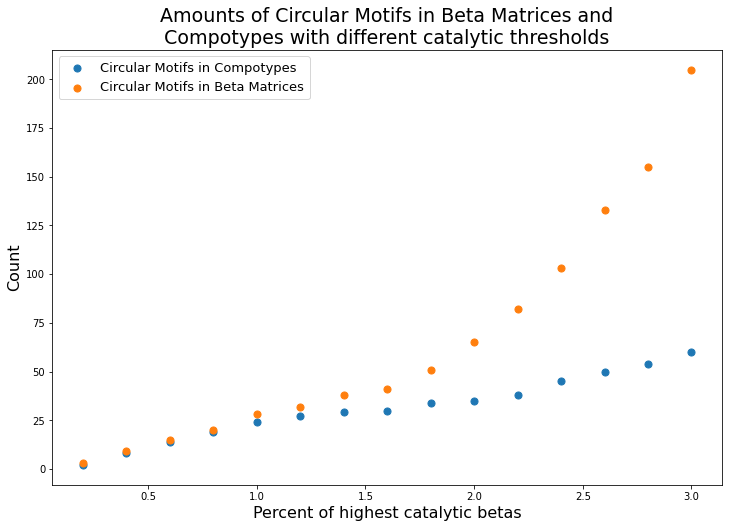

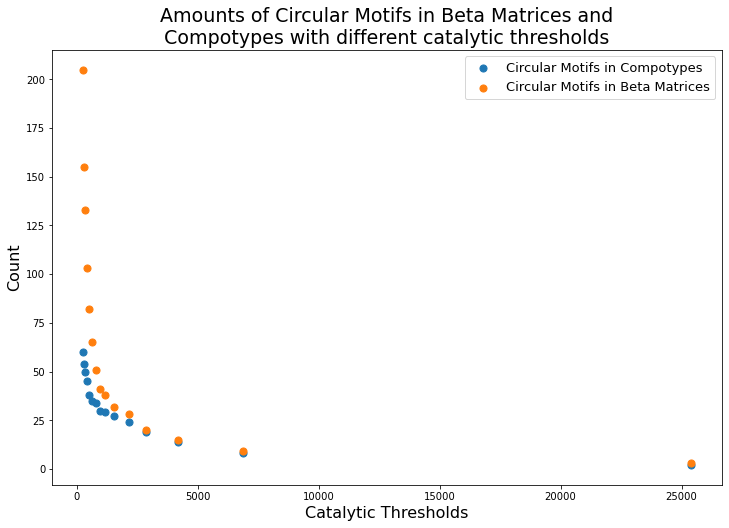

In [46]:
colors = ['tab:blue','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf','#373e02',
          '#ffc512','#ca0147','aqua','#63a950','#ffa62b','#016795','#bc13fe']

'''Motifs amounts for betas and compotypes'''
top = 0
xaxis_thresholds = []
while top < 100:
    top += percent_gap
    xaxis_thresholds.append(top)
compotypes_motifs_amounts = []
betas_motifs_amounts = []
thresholds_order = list(dict_thresholds_motifs_sizes.keys())
for threshold in thresholds_order:
    compotypes_val = len(dict_thresholds_motifs_sizes[threshold]["Compotypes"])
    compotypes_motifs_amounts.append(compotypes_val)
    beta_val = len(dict_thresholds_motifs_sizes[threshold]["Beta Matrices"])
    betas_motifs_amounts.append(beta_val)

plt.figure(figsize=(12,8))
plt.scatter(xaxis_thresholds[:len(thresholds_order)],compotypes_motifs_amounts, s=50, label = "Circular Motifs in Compotypes")
plt.scatter(xaxis_thresholds[:len(thresholds_order)],betas_motifs_amounts, s=50, label = "Circular Motifs in Beta Matrices")
plt.legend(fontsize=13)
# plt.xlim(0,thresholds_amount_choose)
plt.xlabel('Percent of highest catalytic betas',fontsize=16)
plt.ylabel('Count',fontsize=16)
plt.title('Amounts of Circular Motifs in Beta Matrices and\nCompotypes with different catalytic thresholds', fontsize=19)

plt.figure(figsize=(12,8))
plt.scatter(thresholds_order,compotypes_motifs_amounts, s=50, label = "Circular Motifs in Compotypes")
plt.scatter(thresholds_order,betas_motifs_amounts, s=50, label = "Circular Motifs in Beta Matrices")
plt.legend(fontsize=13)
# plt.xlim(0,thresholds_amount_choose)
plt.xlabel('Catalytic Thresholds',fontsize=16)
plt.ylabel('Count',fontsize=16)
plt.title('Amounts of Circular Motifs in Beta Matrices and\nCompotypes with different catalytic thresholds', fontsize=19)

46
75
100
143
159
177
334
675
1108
2040


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anacond

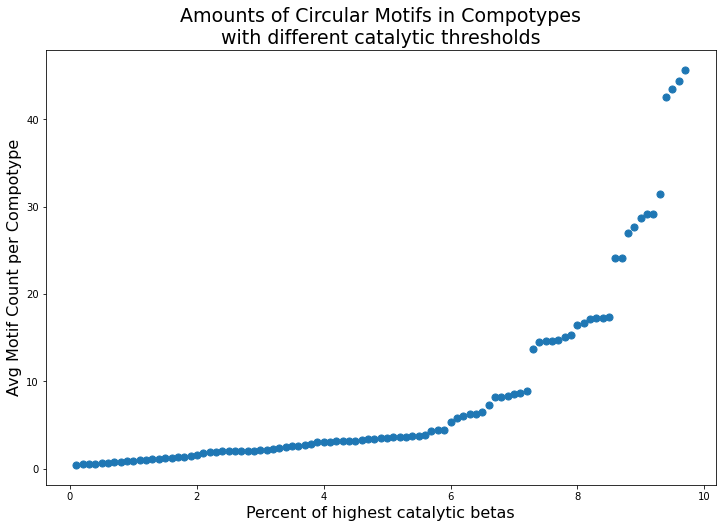

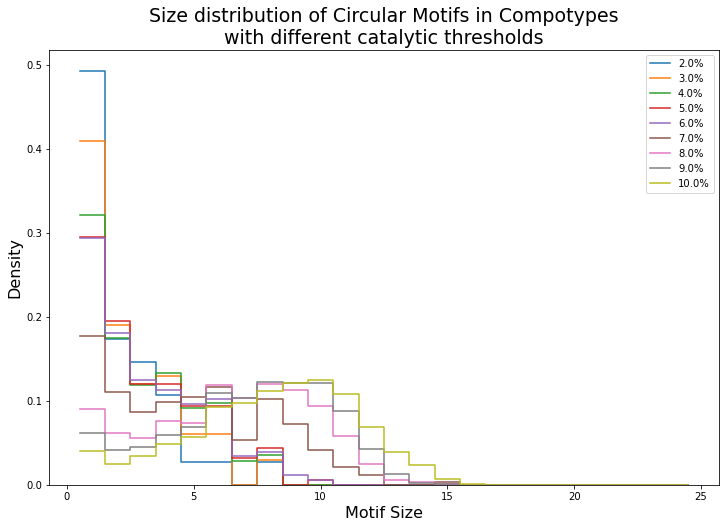

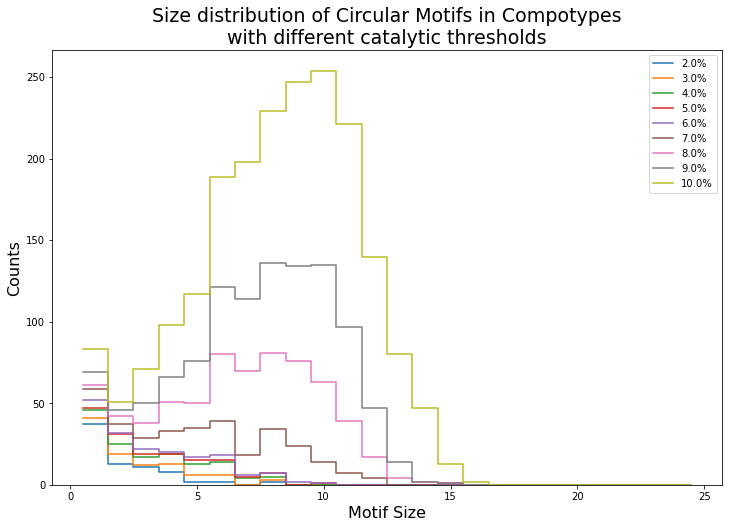

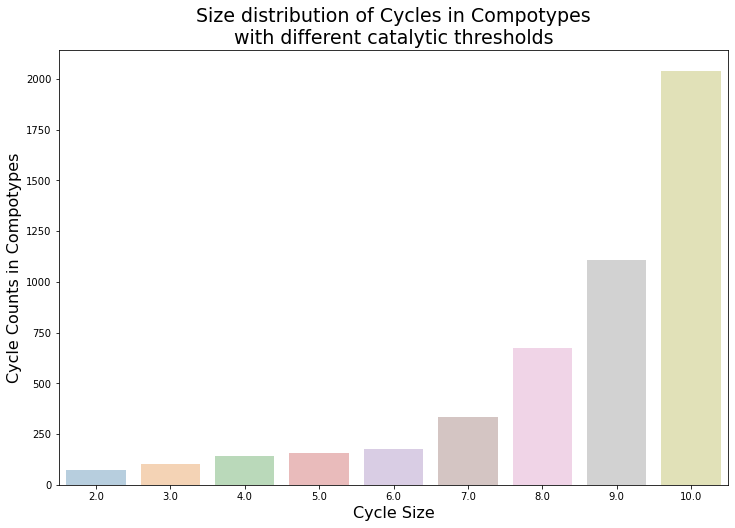

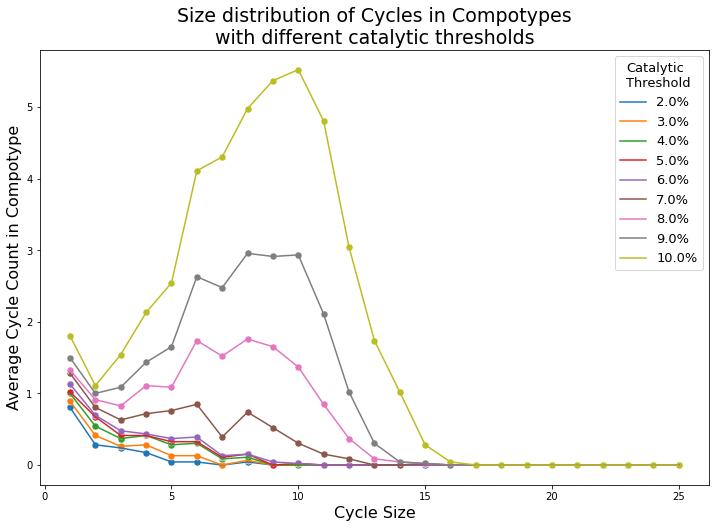

In [95]:
'''Now motifs only for the compotype'''
'''Find thresholds by beta'''
percent_gap = 0.1
only_single_compotypes = True
thresholds = []



if only_single_compotypes:
    all_compotypes_list = sorted(list(comptypes_values_list_array))
else:
    all_compotypes_list = sorted(list(all_compotypes_array))
amount_gap = int(percent_gap*(len(all_compotypes_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_compotypes_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_compotypes_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)
# print(thresholds)

'''Find circular motifs for comptypes and betas with different thresholds'''
# print(thresholds)

thresholds_amount_choose = 101
cutoffs_to_use = [2,3,4,5,6,7,8,9,10]
if only_single_compotypes:
    compotypes_amount = len(list(df_compotypes))
    df_all_compotypes = deepcopy(df_compotypes)
else:
    compotypes_amount = len(list(df_multiple_compotypes.columns)) + len(list(df_compotypes))
    df_all_compotypes = pd.concat([df_compotypes, df_multiple_compotypes], axis=1)
print(compotypes_amount)

compotype_list_all = list(df_all_compotypes.columns)
dict_thresholds_motifs_sizes_compotypes = {}
for threshold_counter, threshold in enumerate(thresholds[:thresholds_amount_choose]):
#     print(threshold_counter+1, threshold)
    motifs_in_compotypes_sizes = []
    for beta in range(1,101):
        if only_single_compotypes:
            if beta not in betas:
                continue
        df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
        compotypes_nmols = []
        for comp_id in compotype_list_all:
            if "." in comp_id:
                comp_id_mod = comp_id.split(".")[0]
            else:
                comp_id_mod = comp_id
            if int(float(comp_id_mod)) == beta:
                compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
                nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
                compotypes_nmols.append(nmol_idxs)
                
        for compotype in compotypes_nmols:
            df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
            columns_list = list(df_beta_matrix_compotype.columns)
            # interaction = (column,row)
            columns_perm = list(permutations(columns_list, 2))
            same_columns_list = [(x,x) for x in columns_list]
            columns_perm.extend(same_columns_list)
            available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
            all_identified_cycles = cycles_identifier(available_interactions)
            for cycle in all_identified_cycles:
                motifs_in_compotypes_sizes.append(len(cycle))
                
    dict_thresholds_motifs_sizes_compotypes[threshold] = motifs_in_compotypes_sizes
    
colors = ['tab:blue','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf','#373e02',
          '#ffc512','#ca0147','aqua','#63a950','#ffa62b','#016795','#bc13fe']

'''Motifs amounts for betas and compotypes'''
top = 0
xaxis_thresholds = []
while top < 100:
    top += percent_gap
    xaxis_thresholds.append(top)
compotypes_motifs_amounts = []
betas_motifs_amounts = []
thresholds_order = list(dict_thresholds_motifs_sizes_compotypes.keys())
for threshold in thresholds_order:
    compotypes_val = len(dict_thresholds_motifs_sizes_compotypes[threshold]) / compotypes_amount
    compotypes_motifs_amounts.append(compotypes_val)

# print(xaxis_thresholds)
plt.figure(figsize=(12,8))
plt.scatter(xaxis_thresholds[:len(thresholds_order)],compotypes_motifs_amounts, s=50, label = "Circular Motifs in Compotypes")
# plt.legend(fontsize=13)
# plt.xlim(0,thresholds_amount_choose)
plt.xlabel('Percent of highest catalytic betas',fontsize=16)
plt.ylabel('Avg Motif Count per Compotype',fontsize=16)
plt.title('Amounts of Circular Motifs in Compotypes\nwith different catalytic thresholds', fontsize=19)

'''Now, say we choose 10% threshold, lets see the size distribution'''
plt.figure(figsize=(12,8))
k=0
for threshold_pos in cutoffs_to_use:
    threshold_pos = (threshold_pos*10)-1
#     print(threshold_pos, thresholds[threshold_pos])
    sns.histplot(dict_thresholds_motifs_sizes_compotypes[thresholds[threshold_pos]],
                 stat="density", color=current_palette[k], alpha=0.35, element="step",
                 label=str((threshold_pos+1)*percent_gap) + "%", bins=24, binrange=(0.5,24.5),
                 fill=False)
    k+=1
plt.title("Size distribution of Circular Motifs in Compotypes\nwith different catalytic thresholds", fontsize=19)
plt.xlabel("Motif Size", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.legend()

'''Now, say we choose 10% threshold, lets see the size distribution'''
plt.figure(figsize=(12,8))
k=0
for threshold_pos in cutoffs_to_use:
    threshold_pos = (threshold_pos*10)-1
#     print(threshold_pos, thresholds[threshold_pos])
    sns.histplot(dict_thresholds_motifs_sizes_compotypes[thresholds[threshold_pos]],
                 color=current_palette[k], alpha=0.35, element="step", fill=False,
                 label=str((threshold_pos+1)*percent_gap) + "%", bins=24, binrange=(0.5,24.5))
    print(len(dict_thresholds_motifs_sizes_compotypes[thresholds[threshold_pos]]))
    k+=1
plt.title("Size distribution of Circular Motifs in Compotypes\nwith different catalytic thresholds", fontsize=19)
plt.xlabel("Motif Size", fontsize=16)
plt.ylabel("Counts", fontsize=16)
plt.legend()

'''Now, say we choose 10% threshold, lets see the size distribution'''
plt.figure(figsize=(12,8))
k=0
barplot_vals = []
percentages_list = []
for threshold_pos in cutoffs_to_use:
    threshold_pos = (threshold_pos*10)-1
    new_val = len(dict_thresholds_motifs_sizes_compotypes[thresholds[threshold_pos]])
    barplot_vals.append(new_val)
    new_percentage = (threshold_pos+1)*percent_gap
    percentages_list.append(new_percentage)
    
sns.barplot(percentages_list,barplot_vals,alpha=0.35)
plt.title("Size distribution of Cycles in Compotypes\nwith different catalytic thresholds", fontsize=19)
plt.xlabel("Cycle Size", fontsize=16)
plt.ylabel("Cycle Counts in Compotypes", fontsize=16)
# plt.legend()

'''SCATTER WITH THRESHOLDS 6%-10%'''
size_cap = 25
size_base = 1
size_step = 1
normalize_by_compt = True
plt.figure(figsize=(12,8))

for threshold_pos in cutoffs_to_use:
    threshold_pos = (threshold_pos*10)-1
    sizes_list = list(range(size_base,size_cap+size_step,size_step))
    size_counts_list = []
    for size_counter,size in enumerate(sizes_list):
        size_count = dict_thresholds_motifs_sizes_compotypes[thresholds[threshold_pos]].count(size)
        if normalize_by_compt:
            size_count /= df_all_compotypes.shape[1]
        size_counts_list.append(size_count)
    sns.scatterplot(sizes_list,size_counts_list,s=50)
    sns.lineplot(sizes_list,size_counts_list, label=str((threshold_pos+1)*percent_gap) + "%")
plt.title("Size distribution of Cycles in Compotypes\nwith different catalytic thresholds", fontsize=19)
plt.xlabel("Cycle Size", fontsize=16)
plt.ylabel("Average Cycle Count in Compotype", fontsize=16)
plt.legend(title="Catalytic\nThreshold",title_fontsize=13,fontsize=13)

In [67]:
'''and here we test whether circle amounts, fraction of nmol lipids in cycles, and total cycles length
correlate with arrival time to compotype of different betas. We choose random threshold (e.g. 5%) and correlate.'''


for beta in betas:
    locals()['data_beta_' + str(beta)] = sio.loadmat('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Beta ' + str(beta) + '\\Standard run beta ' + str(beta) + '.mat')
    print(beta, eval("data_beta_"+str(beta)).keys())
num_init_composition = data_beta_1['num_init_composition'][0][0]

1 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices_seeds', 'compositions', 'fluxes', 'num_init_composition', 'p'])
2 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices', 'beta_matrices_seeds', 'compositions', 'fluxes', 'num_init_composition', 'p'])
6 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices', 'beta_matrices_seeds', 'compositions', 'fluxes', 'num_init_composition', 'p'])
8 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices', 'beta_matrices_seeds', 'compositions', 'fluxes', 'num_init_composition', 'p'])
13 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices', 'beta_matrices_seeds', 'compositions', 'fluxes', 'num_init_composition', 'p'])
15 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices', 'beta_matrices_seeds', 'compositions', 'fluxes', 'num_init_composition', 'p'])
18 dict_keys(['__header__', '__version__', '__globals__', 'beta_matrices', 'beta_matrices_seeds',

In [84]:
'''H Flux'''
for beta in betas:
    print("\n################ Beta: " + str(beta))
    dict_H = {}
    dict_assembly_size = {}
    dict_diversity = {}
    dict_heterogeneity = {}
    for init_comp_counter in range(num_init_composition): # iterating over initial compositions - different runs of the simulation
        print(init_comp_counter)
        dict_H[init_comp_counter] = []
        dict_assembly_size[init_comp_counter] = []
        dict_diversity[init_comp_counter] = []
        dict_heterogeneity[init_comp_counter] = []
        df_comp = pd.DataFrame(eval('data_beta_' + str(beta))['compositions'][0][init_comp_counter].T)
        df_flux = pd.DataFrame(eval('data_beta_' + str(beta))['fluxes'][0][init_comp_counter].T)
        for composition_counter in range(list(np.shape(eval('data_beta_' + str(beta))['compositions'][0][init_comp_counter]))[1]): # iterating over compositions in each run
            assembly_size = np.sum(list(df_comp.iloc[composition_counter]))
            dict_assembly_size[init_comp_counter].append(assembly_size)
            h_comp_flux = H_solver(list(df_comp.iloc[composition_counter]), list(df_flux.iloc[composition_counter]))
            dict_H[init_comp_counter].append(h_comp_flux)
            diversity = len([x for x in list(df_comp.iloc[composition_counter]) if x > 0])
            dict_diversity[init_comp_counter].append(diversity)
            heterogeneity = int(diversity)/int(assembly_size)
            dict_heterogeneity[init_comp_counter].append(heterogeneity)
        
        
    '''H calculation to flux, plus assembly size, diversity and heterogeneity calculations'''
    dict_H_output = copy.deepcopy(dict_H)
    dict_assembly_size_output = copy.deepcopy(dict_assembly_size)
    dict_diversity_output = copy.deepcopy(dict_diversity)
    dict_heterogeneity_output = copy.deepcopy(dict_heterogeneity)
    longest_value = len(sorted(dict_H_output.values(), key=len)[-1])
    for key in dict_H_output:
        current_length = len(dict_H_output[key])
        addition = np.empty(longest_value-current_length)
        addition[:] = np.nan
        addition = list(addition)
        dict_H_output[key].extend(addition)
        dict_assembly_size_output[key].extend(addition)
        dict_diversity_output[key].extend(addition)
        dict_heterogeneity_output[key].extend(addition)

    locals()["df_all_H_beta_"+str(beta)] = pd.DataFrame(dict_H_output).T
    print("df_all_H_beta_"+str(beta))
    locals()["df_all_assembly_size_beta_"+str(beta)] = pd.DataFrame(dict_assembly_size_output).T
    print("df_all_assembly_size_beta_"+str(beta))
    locals()["df_all_diversity_beta_"+str(beta)] = pd.DataFrame(dict_diversity_output).T
    print("df_all_diversity_beta_"+str(beta))
    locals()["df_all_heterogeneity_beta_"+str(beta)] = pd.DataFrame(dict_heterogeneity_output).T
    print("df_all_heterogeneity_beta_"+str(beta))


################ Beta: 1
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_beta_1
df_all_assembly_size_beta_1
df_all_diversity_beta_1
df_all_heterogeneity_beta_1

################ Beta: 2
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_beta_2
df_all_assembly_size_beta_2
df_all_diversity_beta_2
df_all_heterogeneity_beta_2

################ Beta: 6
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
5

91
92
93
94
95
96
97
98
99
df_all_H_beta_39
df_all_assembly_size_beta_39
df_all_diversity_beta_39
df_all_heterogeneity_beta_39

################ Beta: 40
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_beta_40
df_all_assembly_size_beta_40
df_all_diversity_beta_40
df_all_heterogeneity_beta_40

################ Beta: 43
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_beta_43
df_all_assembly_size_beta_43
df_all_diversity_beta_43
df_all_heterogeneity_beta_43

################ Beta: 44
0
1
2
3
4
5


42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_beta_91
df_all_assembly_size_beta_91
df_all_diversity_beta_91
df_all_heterogeneity_beta_91

################ Beta: 92
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_beta_92
df_all_assembly_size_beta_92
df_all_diversity_beta_92
df_all_heterogeneity_beta_92

################ Beta: 93
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
9

In [93]:
'''H Compotype, and between compotype and flux'''
for beta_idx, beta in enumerate(betas):
    print("\n################ Beta: " + str(beta))
    dict_H_compotype = {}
    dict_H_flux_to_compotype = {}
    compotype = np.array(df_compotypes.iloc[:,beta_idx])
#     print(compotype)
    for init_comp_counter in range(num_init_composition): # iterating over initial compositions - different runs of the simulation
        print(init_comp_counter)
        dict_H_compotype[init_comp_counter] = []
        dict_H_flux_to_compotype[init_comp_counter] = []
        df_comp = pd.DataFrame(eval('data_beta_' + str(beta))['compositions'][0][init_comp_counter].T)
        df_flux = pd.DataFrame(eval('data_beta_' + str(beta))['fluxes'][0][init_comp_counter].T)
        for composition_counter in range(list(np.shape(eval('data_beta_' + str(beta))['compositions'][0][init_comp_counter]))[1]): # iterating over compositions in each run
            h_comp_flux = H_solver(list(df_comp.iloc[composition_counter]), compotype)
            dict_H_compotype[init_comp_counter].append(h_comp_flux)
            h_comp_flux = H_solver(list(df_flux.iloc[composition_counter]), compotype)
            dict_H_flux_to_compotype[init_comp_counter].append(h_comp_flux)

    dict_H_compotype_output = copy.deepcopy(dict_H_compotype)
    dict_H_flux_to_compotype_output = copy.deepcopy(dict_H_flux_to_compotype)
    #longest_value = len(sorted(dict_H_compotype_output.values(), key=len)[-1])
    longest_value = len(sorted(dict_H_compotype_output.values(), key=len)[-1])
    for key in dict_H_compotype_output:
        current_length = len(dict_H_compotype_output[key])
        addition = np.empty(longest_value-current_length)
        addition[:] = np.nan
        addition = list(addition)
        dict_H_compotype_output[key].extend(addition)
        dict_H_flux_to_compotype_output[key].extend(addition)

    locals()["df_all_H_flux_to_compotype_beta_"+str(beta)] = pd.DataFrame(dict_H_flux_to_compotype_output).T
    print('df_all_H_flux_to_compotype_beta_'+str(beta))
    locals()["df_all_H_compotype_beta_"+str(beta)] = pd.DataFrame(dict_H_compotype_output).T
    print('df_all_H_compotype_beta_'+str(beta))


################ Beta: 1
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_1
df_all_H_compotype_beta_1

################ Beta: 2
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_2
df_all_H_compotype_beta_2

################ Beta: 6
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
7

77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_43
df_all_H_compotype_beta_43

################ Beta: 44
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_44
df_all_H_compotype_beta_44

################ Beta: 46
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_46
df_all_H_compotype_beta_46

################ Beta: 49
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
3

29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_97
df_all_H_compotype_beta_97

################ Beta: 98
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_beta_98
df_all_H_compotype_beta_98

################ Beta: 100
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
df_all_H_flux_to_compotype_b

In [100]:
'''calculate arrival time to compotype for all single-compotype betas'''
compotype_similarity_threshold = 0.9
arrival_time_dict = {}
arrival_time_means_dict = {}
arrival_time_sem_dict = {}
arrival_time_std_dict = {}
for beta_idx, beta in enumerate(betas):
    print(beta)
    arrival_time_dict[beta] = []
    for init_cond_idx in range(eval("df_all_H_compotype_beta_"+str(beta)).shape[0]):
        for step_idx in range(eval("df_all_H_compotype_beta_"+str(beta)).shape[1]):
            if eval("df_all_H_compotype_beta_"+str(beta)).iloc[init_cond_idx,step_idx] >= compotype_similarity_threshold:
                arrival_time_dict[beta].append(step_idx)
                break
            elif str(eval("df_all_H_compotype_beta_"+str(beta)).iloc[init_cond_idx,step_idx]) == str(np.nan):
                print('not reached')
                break
    arrival_time_means_dict[beta] = np.mean(arrival_time_dict[beta])
    arrival_time_sem_dict[beta] = stats.sem(arrival_time_dict[beta])
    arrival_time_std_dict[beta] = np.std(arrival_time_dict[beta])

1
not reached
not reached
not reached
2
not reached
6
8
not reached
not reached
not reached
13
15
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
18
19
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
21
22
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
not reached
no

46
dict_values([552.0309278350516, 263.37373737373736, 269.74, 499.3229166666667, 202.08, 413.7717391304348, 400.37, 773.8607594936709, 405.28, 999.5454545454545, 794.7179487179487, 1010.4468085106383, 179.0531914893617, 483.06451612903226, 455.09090909090907, 172.79, 334.58, 151.91, 431.08, 221.26, 210.72, 282.81, 503.71084337349396, 512.59, 189.04, 387.73, 191.49, 352.6063829787234, 151.33, 392.0326086956522, 331.38, 1010.1940298507462, 258.89, 421.67, 560.67, 113.93, 657.3258426966293, 293.96, 461.85, 366.1279069767442, 104.4, 855.8924731182796, 424.6666666666667, 233.56, 378.61, 536.1041666666666])
2 46.9
[1, 3, 3, 2, 0, 1, 1, 2, 14, 1, 1, 3, 1, 1, 3, 0, 1, 5, 1, 2, 0, 0, 2, 0, 1, 3, 0, 3, 1, 1, 2, 5, 2, 3, 0, 1, 3, 1, 2, 2, 1, 3, 3, 1, 1, 3]
[24]
[11]
[64, 61, 42, 21]
[68, 61, 42, 21, 20]
[33, 43, 11, 76, 95, 75]
[11, 76, 19, 43]
[11, 19, 43]
[78]
[2, 4, 78]
[62]
[67, 70, 50, 17, 26]
[64, 98, 76, 87, 23, 92, 93, 21]
[64, 43, 23, 92, 93, 21]
[32]
[10]
[85]
[64, 10, 91, 82]
[64, 10,

[34, 24, 8, 4, 76, 30]
[34, 24, 8, 4, 76, 27, 80, 56, 92]
[34, 24, 8, 4, 76, 27, 80, 56, 30]
[4, 80, 56, 92, 76, 30, 55, 83, 73, 74, 53]
[4, 80, 56, 92, 76, 30, 55, 83, 73, 8]
[4, 80, 56, 92, 76, 30, 55, 83]
[4, 80, 56, 92, 76, 30, 55, 24, 8]
[4, 80, 56, 92, 76, 30, 55, 8]
[4, 80, 56, 92, 76, 30, 24, 8]
[4, 80, 56, 92, 76, 30]
[4, 80, 56, 92, 73, 74, 53]
[4, 80, 56, 92, 73, 8]
[4, 80, 56, 92, 63, 83, 73, 74, 53]
[4, 80, 56, 92, 63, 83, 73, 8]
[4, 80, 56, 92, 63, 83]
[4, 80, 56, 92, 53]
[4, 80, 56, 73, 74, 53]
[4, 80, 56, 73, 8, 92, 76, 30, 55, 83]
[4, 80, 56, 73, 8, 92, 76, 30]
[4, 80, 56, 73, 8, 92, 63, 83]
[4, 80, 56, 73, 8, 92, 53]
[4, 80, 56, 73, 8]
[4, 80, 56, 30, 55, 83, 73, 74, 53]
[4, 80, 56, 30, 55, 83, 73, 8, 92, 53]
[4, 80, 56, 30, 55, 83, 73, 8]
[4, 80, 56, 30, 55, 83]
[4, 80, 56, 30, 55, 24, 8, 92, 73, 74, 53]
[4, 80, 56, 30, 55, 24, 8, 92, 63, 83, 73, 74, 53]
[4, 80, 56, 30, 55, 24, 8, 92, 63, 83]
[4, 80, 56, 30, 55, 24, 8, 92, 53]
[4, 80, 56, 30, 55, 24, 8]
[4, 80, 56, 3

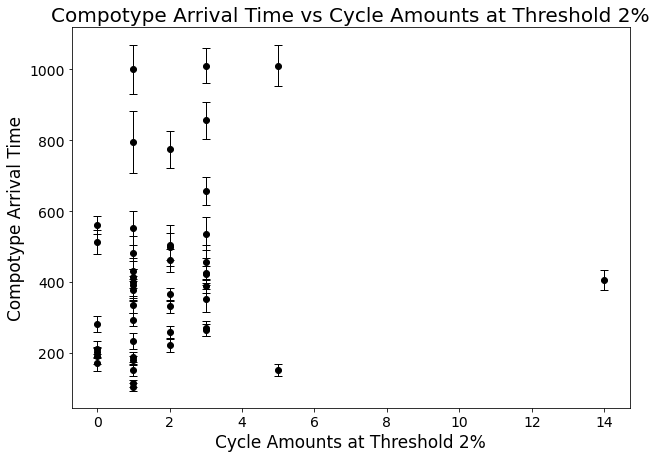

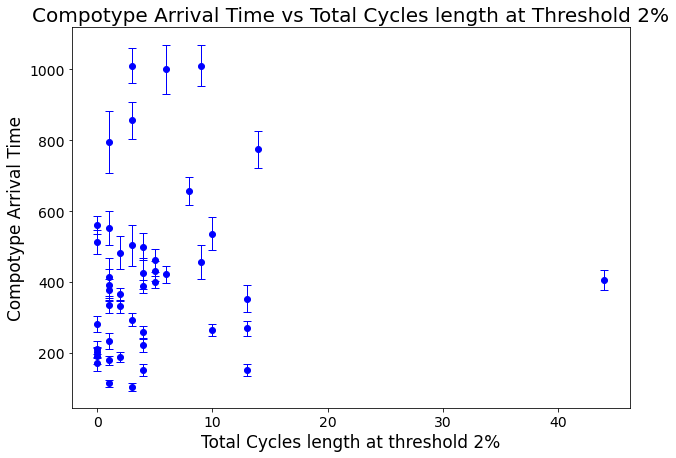

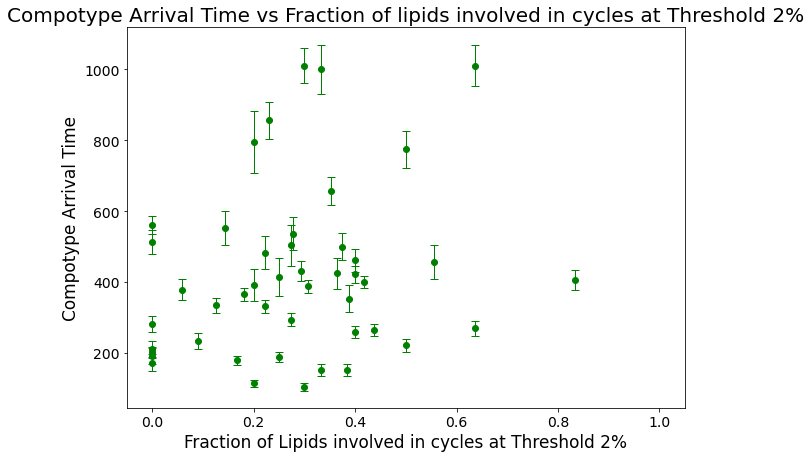

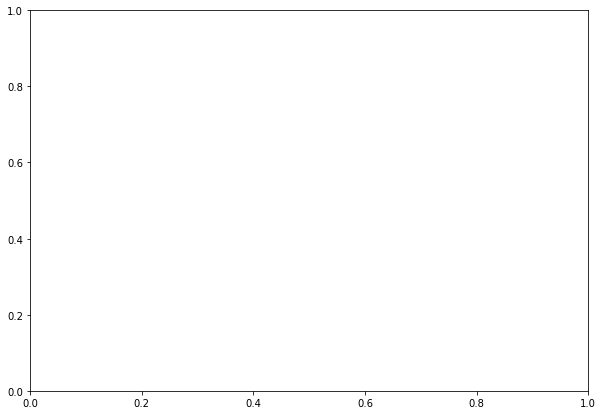

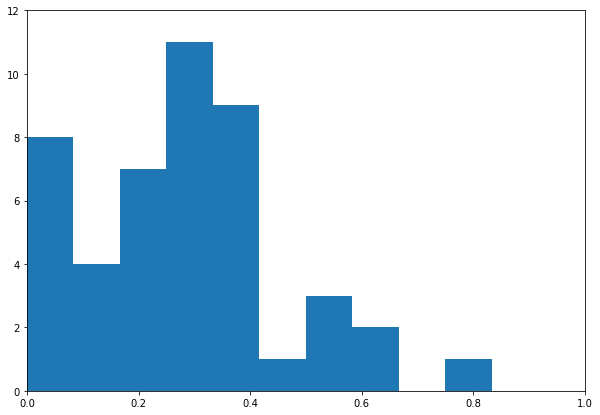

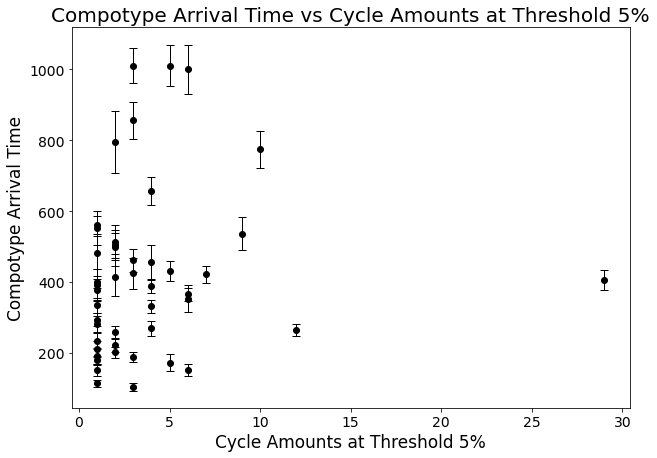

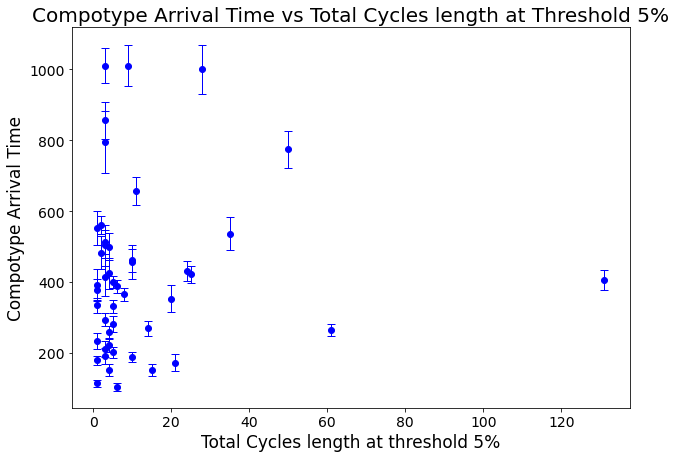

Error in callback <function flush_figures at 0x0000017564065A60> (for post_execute):


KeyboardInterrupt: 

In [267]:
"""Here we compare the arrival time to cycles variables"""
percent_gap = 1
only_single_compotypes = True
thresholds_amount_choose = 11
thresholds_on_individual_compotypes = False
cutoffs_to_use = [2,5,10]
colors = ['tab:blue','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf','#373e02',
          '#ffc512','#ca0147','aqua','#63a950','#ffa62b','#016795','#bc13fe']


'''Find thresholds'''
thresholds = []
if not thresholds_on_individual_compotypes:
    if only_single_compotypes:
        all_compotypes_list = sorted(list(comptypes_values_list_array))
    else:
        all_compotypes_list = sorted(list(all_compotypes_array))
    amount_gap = int(percent_gap*(len(all_compotypes_list) / 100))
    sections_num = int(np.floor(100/percent_gap))
    base = len(all_compotypes_list)
    for jump in range(1,sections_num+1):
        val_at_cutoff = all_compotypes_list[base-amount_gap]
    #     print(base,val_at_cutoff)
        base -= amount_gap
        thresholds.append(val_at_cutoff)
    thresholds = np.exp(thresholds)
    # print(thresholds)

    '''Find circular motifs for comptypes and betas with different thresholds'''
    # print(thresholds)
    if only_single_compotypes:
        compotypes_amount = len(list(df_compotypes))
        df_all_compotypes = deepcopy(df_compotypes)
    else:
        compotypes_amount = len(list(df_multiple_compotypes.columns)) + len(list(df_compotypes))
        df_all_compotypes = pd.concat([df_compotypes, df_multiple_compotypes], axis=1)
    print(compotypes_amount)

    compotype_list_all = list(df_all_compotypes.columns)
    dict_thresholds_cycles_compotypes = {}
    nmols_for_compotypes_thresholds_dict = {}
    for threshold_counter, threshold in enumerate(thresholds[:thresholds_amount_choose]):
    #     print(threshold_counter+1, threshold)
        beta_cycles_dict = {}
        nmols_for_compotypes_dict = {}
        for beta in range(1,101):
            if only_single_compotypes:
                if beta not in betas:
                    continue
            beta_cycles_dict[beta] = []
            df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
            compotypes_nmols = []
            for comp_id in compotype_list_all:
                if "." in comp_id:
                    comp_id_mod = comp_id.split(".")[0]
                else:
                    comp_id_mod = comp_id
                if int(float(comp_id_mod)) == beta:
                    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
                    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
                    compotypes_nmols.append(nmol_idxs)

            nmols_for_compotypes_dict[beta] = compotypes_nmols
            for compotype in compotypes_nmols:
                df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
                columns_list = list(df_beta_matrix_compotype.columns)
                # interaction = (column,row)
                columns_perm = list(permutations(columns_list, 2))
                same_columns_list = [(x,x) for x in columns_list]
                columns_perm.extend(same_columns_list)
                available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
                all_identified_cycles = cycles_identifier(available_interactions)
                for cycle in all_identified_cycles:
                    beta_cycles_dict[beta].append(cycle)              
        dict_thresholds_cycles_compotypes[threshold] = beta_cycles_dict
        nmols_for_compotypes_thresholds_dict[threshold] = nmols_for_compotypes_dict
        
    print(arrival_time_means_dict.values())
    for threshold_real in cutoffs_to_use:
        threshold_pos = round((threshold_real*round(1/percent_gap))-1)
        print(threshold_real,thresholds[threshold_pos])
        
        
        '''First variable - cycle amounts'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_amounts = []
        for beta in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]].keys():
            val = len(dict_thresholds_cycles_compotypes[thresholds[threshold_pos]][beta])
            cycle_amounts.append(val)
        print(cycle_amounts)
        plt.errorbar(cycle_amounts,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='k',linewidth = 1, ecolor='k')
        plt.title("Compotype Arrival Time vs Cycle Amounts at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Cycle Amounts at Threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

        '''Second variable - total length of cycles'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_lengths = []
        for beta in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]].keys():
            lengths = []
            for cycle in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]][beta]:
                lengths.extend(cycle)
            cycle_lengths.append(len(lengths))
        plt.errorbar(cycle_lengths,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='b',linewidth = 1,capsize = 4, ecolor='b')
        plt.title("Compotype Arrival Time vs Total Cycles length at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Total Cycles length at threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

        '''Third variable - lipid involvement in cycles'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_lipid_involvement = []
        for beta in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]].keys():
            lipids_in_cycles = []
            for cycle in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]][beta]:
                lipids_in_cycles.extend(cycle)
            lipids_in_cycles = list(set(lipids_in_cycles))
    #         print(lipids_in_cycles, nmols_for_compotypes_thresholds_dict[threshold][beta])
            involvement = len(lipids_in_cycles) / len(nmols_for_compotypes_thresholds_dict[thresholds[threshold_pos]][beta][0])
            cycle_lipid_involvement.append(involvement)
        plt.errorbar(cycle_lipid_involvement,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='g',linewidth = 1,capsize = 4, ecolor='g')
        plt.title("Compotype Arrival Time vs Fraction of lipids involved in cycles at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Fraction of Lipids involved in cycles at Threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)
        plt.xlim(-0.05,1.05)
        
        
            
            
        
        
        
        
        
        
        
        
        
        
        fig, ax = plt.subplots(figsize=(10, 7))
        plt.hist(cycle_lipid_involvement)
        plt.xlim(0,1)
        plt.ylim(0,12)


else:
    dict_thresholds_cycles_compotypes = {}
    nmols_for_compotypes_thresholds_dict = {}
    for threshold in cutoffs_to_use:
        print(threshold)
        beta_cycles_dict = {}
        nmols_for_compotypes_dict = {}
        for beta in range(1,101):
            if only_single_compotypes:
                if beta not in betas:
                    continue
            beta_cycles_dict[beta] = []
            df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
            compotypes_nmols = []
            
            for comp_id in compotype_list_all:
                if "." in comp_id:
                    comp_id_mod = comp_id.split(".")[0]
                else:
                    comp_id_mod = comp_id
                if int(float(comp_id_mod)) == beta:
                    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
                    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
                    compotypes_nmols.append(nmol_idxs)

            nmols_for_compotypes_dict[beta] = compotypes_nmols
            for compotype in compotypes_nmols:
                df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
                all_vals_relevant = []
                for row_idx in range(df_beta_matrix_compotype.shape[0]):
                    row_val = list(df_beta_matrix_compotype.iloc[row_idx,:])
                    all_vals_relevant.extend(row_val)
                all_vals_relevant = sorted(all_vals_relevant,reverse=True)
                cutoff_pos = round(len((all_vals_relevant)*threshold)/100)
                threshold_val = all_vals_relevant[cutoff_pos]   ## only > than this

                columns_list = list(df_beta_matrix_compotype.columns)
                # interaction = (column,row)
                columns_perm = list(permutations(columns_list, 2))
                same_columns_list = [(x,x) for x in columns_list]
                columns_perm.extend(same_columns_list)
                available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] > threshold_val]
                all_identified_cycles = cycles_identifier(available_interactions)
                for cycle in all_identified_cycles:
                    beta_cycles_dict[beta].append(cycle)              
        dict_thresholds_cycles_compotypes[threshold] = beta_cycles_dict
        nmols_for_compotypes_thresholds_dict[threshold] = nmols_for_compotypes_dict
    
    
    print(arrival_time_means_dict.values())
    for threshold_real in cutoffs_to_use:

        '''First variable - cycle amounts'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_amounts = []
        for beta in dict_thresholds_cycles_compotypes[threshold_real].keys():
            val = len(dict_thresholds_cycles_compotypes[threshold_real][beta])
            cycle_amounts.append(val)
        print(cycle_amounts)
        plt.errorbar(cycle_amounts,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='k',linewidth = 1,capsize = 4, ecolor='k')
        plt.title("Compotype Arrival Time vs Cycle Amounts at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Cycle Amounts at Threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

        '''Second variable - total length of cycles'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_lengths = []
        for beta in dict_thresholds_cycles_compotypes[threshold_real].keys():
            lengths = []
            for cycle in dict_thresholds_cycles_compotypes[threshold_real][beta]:
                lengths.extend(cycle)
            cycle_lengths.append(len(lengths))
        plt.errorbar(cycle_lengths,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='b',linewidth = 1,capsize = 4, ecolor='b')
        plt.title("Compotype Arrival Time vs Total Cycles length at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Total Cycles length at threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

        '''Third variable - lipid involvement in cycles'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_lipid_involvement = []
        for beta in dict_thresholds_cycles_compotypes[threshold_real].keys():
            lipids_in_cycles = []
            for cycle in dict_thresholds_cycles_compotypes[threshold_real][beta]:
                lipids_in_cycles.extend(cycle)
            lipids_in_cycles = list(set(lipids_in_cycles))
    #         print(lipids_in_cycles, nmols_for_compotypes_thresholds_dict[threshold][beta])
            involvement = len(lipids_in_cycles) / len(nmols_for_compotypes_thresholds_dict[threshold_real][beta][0])
            cycle_lipid_involvement.append(involvement)
        plt.errorbar(cycle_lipid_involvement,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='g',linewidth = 1,capsize = 4, ecolor='g')
        plt.title("Compotype Arrival Time vs Fraction of lipids involved in cycles at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Fraction of Lipids involved in cycles at Threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)
        plt.xlim(0,1)
        
        
        fig, ax = plt.subplots(figsize=(10, 7))
        plt.hist(cycle_lipid_involvement)

In [168]:
def dfShuffle(df):
    df = df.sample(frac=1)
    columns = list(df.columns)
    new_columns = random.shuffle(columns)
    df = df.reindex(columns=new_columns)
    return(df)

46
Threshold counter: 2
Threshold counter: 5
Threshold counter: 10
2.0 46.9
first figure
second figure
third figure
5.0 12.9
first figure
second figure
third figure
10.0 3.22
first figure
second figure
third figure


<ipython-input-178-b6542331db04>:127: RuntimeWarning: divide by zero encountered in log2
  fold_change = np.log2(fold_change)
<ipython-input-178-b6542331db04>:159: RuntimeWarning: divide by zero encountered in log2
  fold_change = np.log2(fold_change)
<ipython-input-178-b6542331db04>:194: RuntimeWarning: divide by zero encountered in log2
  fold_change = np.log2(fold_change)


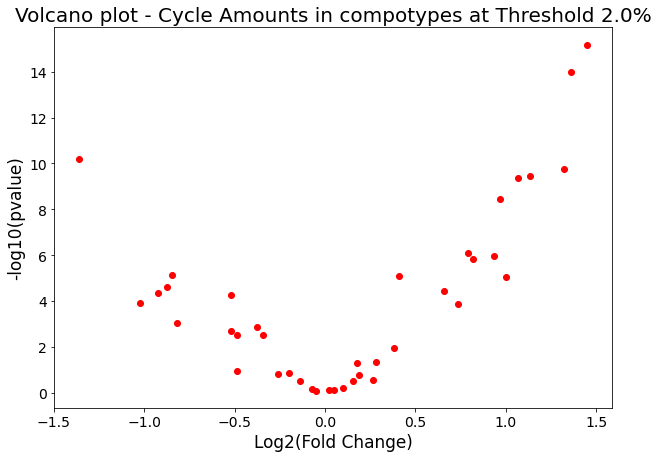

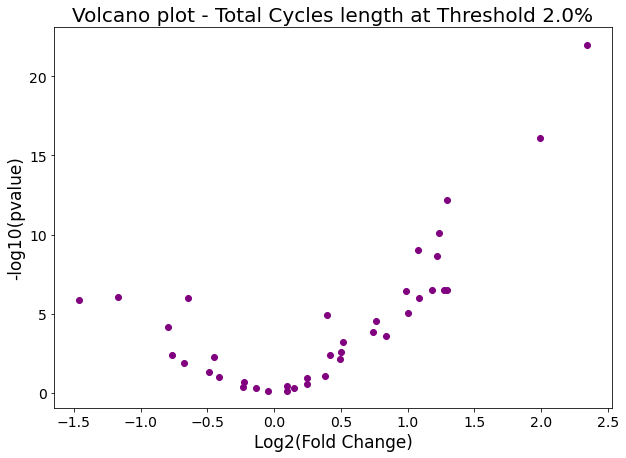

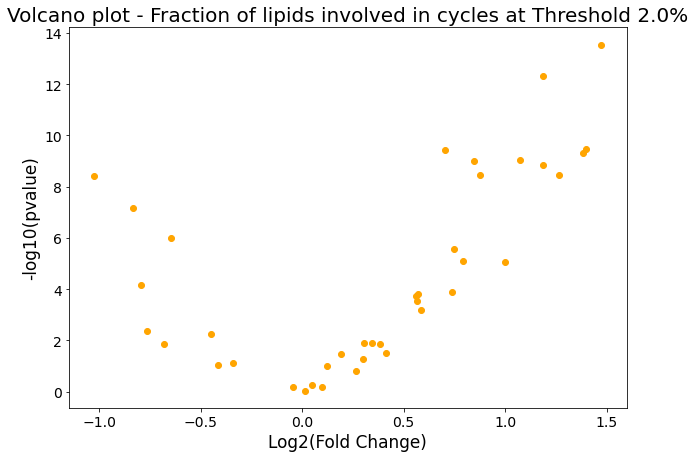

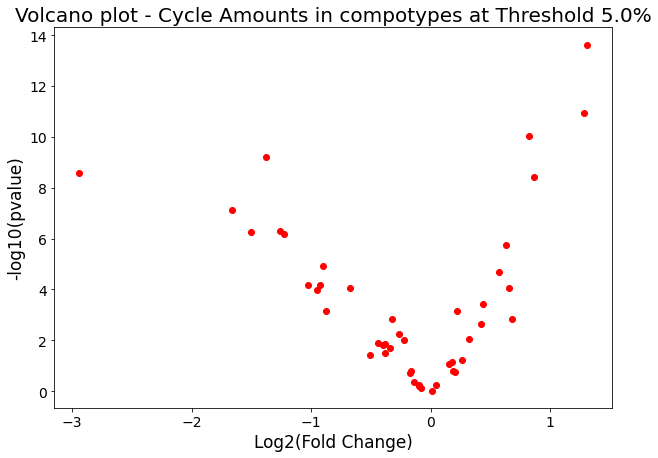

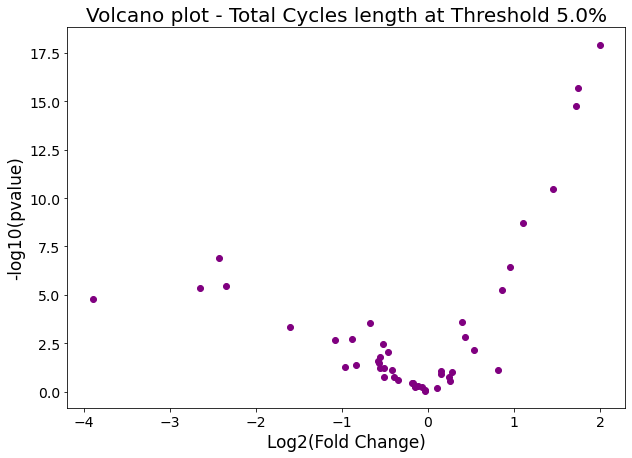

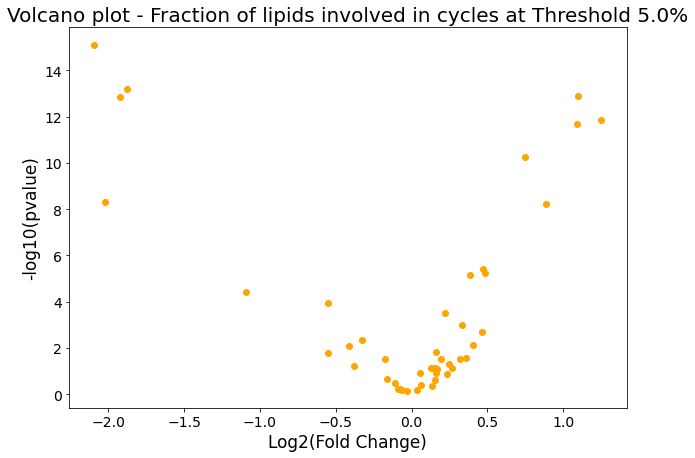

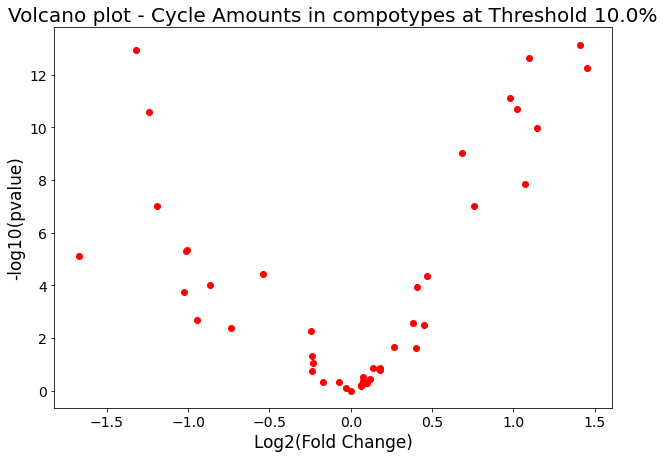

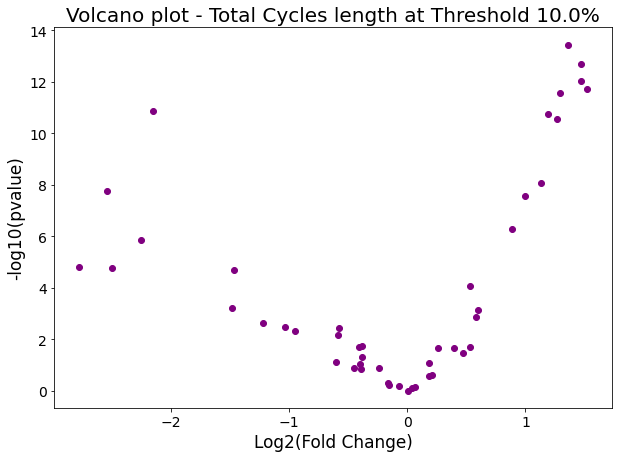

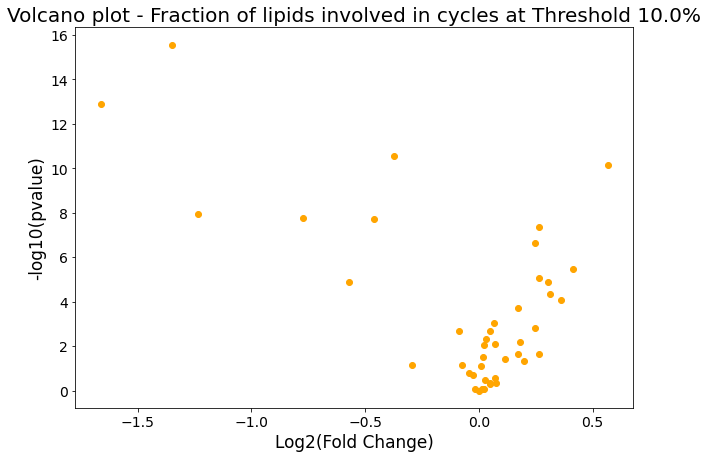

In [178]:
"""Here we compare the arrival time to cycles variables"""
percent_gap = 1
only_single_compotypes = True
thresholds_amount_choose = 11
thresholds_on_individual_compotypes = False
cutoffs_to_use = [2.0,5.0,10.0]
null_repeats = 30
colors = ['tab:blue','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf','#373e02',
          '#ffc512','#ca0147','aqua','#63a950','#ffa62b','#016795','#bc13fe']
cutoffs_to_use = list(map(float,cutoffs_to_use))

'''Find thresholds'''
thresholds = []
if not thresholds_on_individual_compotypes:
    if only_single_compotypes:
        all_compotypes_list = sorted(list(comptypes_values_list_array))
    else:
        all_compotypes_list = sorted(list(all_compotypes_array))
    amount_gap = int(percent_gap*(len(all_compotypes_list) / 100))
    sections_num = int(np.floor(100/percent_gap))
    base = len(all_compotypes_list)
    for jump in range(1,sections_num+1):
        val_at_cutoff = all_compotypes_list[base-amount_gap]
    #     print(base,val_at_cutoff)
        base -= amount_gap
        thresholds.append(val_at_cutoff)
    thresholds = np.exp(thresholds)
    # print(thresholds)

    '''Find circular motifs for comptypes and betas with different thresholds'''
    # print(thresholds)
    if only_single_compotypes:
        compotypes_amount = len(list(df_compotypes))
        df_all_compotypes = deepcopy(df_compotypes)
    else:
        compotypes_amount = len(list(df_multiple_compotypes.columns)) + len(list(df_compotypes))
        df_all_compotypes = pd.concat([df_compotypes, df_multiple_compotypes], axis=1)
    print(compotypes_amount)

    compotype_list_all = list(df_all_compotypes.columns)
    dict_thresholds_cycles_compotypes = {}
    nmols_for_compotypes_thresholds_dict = {}
    dict_thresholds_cycles_compotypes_null = {}
    for threshold_counter, threshold in enumerate(thresholds[:thresholds_amount_choose]):
        threshold_counter_real = float(threshold_counter+1*percent_gap)
        if threshold_counter_real not in cutoffs_to_use:
            continue
        print('Threshold counter: '+str(threshold_counter+1))
    #     print(threshold_counter+1, threshold)
        beta_cycles_dict = {}
        nmols_for_compotypes_dict = {}
        null_cycles_dict = {}
        for beta in range(1,101):
            if only_single_compotypes:
                if beta not in betas:
                    continue
#             print(beta)
            beta_cycles_dict[beta] = []
            null_cycles_dict[beta] = {}
            df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
            compotypes_nmols = []
            for comp_id in compotype_list_all:
                if "." in comp_id:
                    comp_id_mod = comp_id.split(".")[0]
                else:
                    comp_id_mod = comp_id
                if int(float(comp_id_mod)) == beta:
                    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
                    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
                    compotypes_nmols.append(nmol_idxs)

            nmols_for_compotypes_dict[beta] = compotypes_nmols
            for compotype in compotypes_nmols:
                df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
                columns_list = list(df_beta_matrix_compotype.columns)
                # interaction = (column,row)
                columns_perm = list(permutations(columns_list, 2))
                same_columns_list = [(x,x) for x in columns_list]
                columns_perm.extend(same_columns_list)
                available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
                all_identified_cycles = cycles_identifier(available_interactions)
                for cycle in all_identified_cycles:
                    beta_cycles_dict[beta].append(cycle)
                
                '''null model'''
                org_indices = df_beta_matrix_compotype.index
                org_columns = df_beta_matrix_compotype.columns
                null_cycles = []
                for null in range(null_repeats):
                    null_cycles_dict[beta][null] = []
                    df_beta_matrix_compotype_null = dfShuffle(df_beta_matrix_compotype)
                    df_beta_matrix_compotype_null.index = org_indices
                    df_beta_matrix_compotype_null.columns = org_columns
                    columns_perm = list(permutations(org_columns, 2))
                    same_columns_list = [(x,x) for x in org_columns]
                    columns_perm.extend(same_columns_list)
                    available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype_null.loc[y,x] >= threshold]
                    all_identified_cycles = cycles_identifier(available_interactions)
                    for cycle in all_identified_cycles:
                        null_cycles_dict[beta][null].append(cycle)
                    

        dict_thresholds_cycles_compotypes[threshold] = beta_cycles_dict
        nmols_for_compotypes_thresholds_dict[threshold] = nmols_for_compotypes_dict
        dict_thresholds_cycles_compotypes_null[threshold] = null_cycles_dict
        
        
    for threshold_real in cutoffs_to_use:
        threshold_pos = round((threshold_real*round(1/percent_gap))-1)
        print(threshold_real,thresholds[threshold_pos])
        
        
        '''First variable - cycle amounts'''
        print('first figure')
        fig, ax = plt.subplots(figsize=(10, 7))
        log2_foldchanges = []
        minus_log10_pval_list = []
        for beta in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]].keys():
            val = len(dict_thresholds_cycles_compotypes[thresholds[threshold_pos]][beta])
            null_cycles_db = dict_thresholds_cycles_compotypes_null[thresholds[threshold_pos]][beta].values()
            null_cycles_amounts = list(map(len,null_cycles_db))
            ttest = stats.ttest_1samp(a=null_cycles_amounts,popmean=val)
            pval = -np.log10(ttest[1])
            minus_log10_pval_list.append(pval)
            null_mean_cycle_amount = np.mean(null_cycles_amounts)
            fold_change = val/null_mean_cycle_amount
            fold_change = np.log2(fold_change)
            log2_foldchanges.append(fold_change)
        
        plt.scatter(log2_foldchanges,minus_log10_pval_list,color='r')
        plt.title("Volcano plot - Cycle Amounts in compotypes at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Log2(Fold Change)",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("-log10(pvalue)",fontsize=17)

        
        '''Second variable - total length of cycles'''
        print('second figure')
        fig, ax = plt.subplots(figsize=(10, 7))
        log2_foldchanges = []
        minus_log10_pval_list = []
        for beta in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]].keys():
            lengths = []
            for cycle in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]][beta]:
                lengths.extend(cycle)
            len_lengths = len(lengths)
            null_cycles_db = dict_thresholds_cycles_compotypes_null[thresholds[threshold_pos]][beta].values()
            all_null_lengths = []
            for null in null_cycles_db:
                null_lengths = []
                for cycle in null:
                    null_lengths.extend(cycle)
                all_null_lengths.append(len(null_lengths))
            ttest = stats.ttest_1samp(a=all_null_lengths,popmean=len_lengths)
            pval = -np.log10(ttest[1])
            minus_log10_pval_list.append(pval)
            null_mean_cycle_length = np.mean(all_null_lengths)
            fold_change = len_lengths/null_mean_cycle_length
            fold_change = np.log2(fold_change)
            log2_foldchanges.append(fold_change)
                
        plt.scatter(log2_foldchanges,minus_log10_pval_list,color='purple')
        plt.title("Volcano plot - Total Cycles length at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Log2(Fold Change)",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("-log10(pvalue)",fontsize=17)

        
        '''Third variable - lipid involvement in cycles'''
        print('third figure')
        fig, ax = plt.subplots(figsize=(10, 7))
        log2_foldchanges = []
        minus_log10_pval_list = []
        for beta in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]].keys():
            lipids_in_cycles = []
            for cycle in dict_thresholds_cycles_compotypes[thresholds[threshold_pos]][beta]:
                lipids_in_cycles.extend(cycle)
            lipids_in_cycles = list(set(lipids_in_cycles))
            involvement = len(lipids_in_cycles) / len(nmols_for_compotypes_thresholds_dict[thresholds[threshold_pos]][beta][0])
            null_cycles_db = dict_thresholds_cycles_compotypes_null[thresholds[threshold_pos]][beta].values()
            all_null_involvements = []
            for null in null_cycles_db:
                null_lipids = []
                for cycle in null:
                    null_lipids.extend(cycle)
                null_lipids = list(set(null_lipids))
                null_involvement = len(null_lipids)/len(nmols_for_compotypes_thresholds_dict[thresholds[threshold_pos]][beta][0])
                all_null_involvements.append(null_involvement)
            ttest = stats.ttest_1samp(a=all_null_involvements,popmean=involvement)
            pval = -np.log10(ttest[1])
            minus_log10_pval_list.append(pval)
            null_mean_cycle_involvement = np.mean(all_null_involvements)
            fold_change = involvement/null_mean_cycle_involvement
            fold_change = np.log2(fold_change)
            log2_foldchanges.append(fold_change)
            
        plt.scatter(log2_foldchanges,minus_log10_pval_list,color='orange')
        plt.title("Volcano plot - Fraction of lipids involved in cycles at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Log2(Fold Change)",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("-log10(pvalue)",fontsize=17)


else:
    dict_thresholds_cycles_compotypes = {}
    nmols_for_compotypes_thresholds_dict = {}
    dict_thresholds_cycles_compotypes_null = {}
    for threshold in cutoffs_to_use:
        print(threshold)
        beta_cycles_dict = {}
        nmols_for_compotypes_dict = {}
        for beta in range(1,101):
            if only_single_compotypes:
                if beta not in betas:
                    continue
            beta_cycles_dict[beta] = []
            null_cycles_dict[beta] = {}
            df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
            compotypes_nmols = []
            
            for comp_id in compotype_list_all:
                if "." in comp_id:
                    comp_id_mod = comp_id.split(".")[0]
                else:
                    comp_id_mod = comp_id
                if int(float(comp_id_mod)) == beta:
                    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
                    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
                    compotypes_nmols.append(nmol_idxs)

            nmols_for_compotypes_dict[beta] = compotypes_nmols
            for compotype in compotypes_nmols:
                df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
                all_vals_relevant = []
                for row_idx in range(df_beta_matrix_compotype.shape[0]):
                    row_val = list(df_beta_matrix_compotype.iloc[row_idx,:])
                    all_vals_relevant.extend(row_val)
                all_vals_relevant = sorted(all_vals_relevant,reverse=True)
                cutoff_pos = round(len((all_vals_relevant)*threshold)/100)
                threshold_val = all_vals_relevant[cutoff_pos]   ## only > than this

                columns_list = list(df_beta_matrix_compotype.columns)
                # interaction = (column,row)
                columns_perm = list(permutations(columns_list, 2))
                same_columns_list = [(x,x) for x in columns_list]
                columns_perm.extend(same_columns_list)
                available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] > threshold_val]
                all_identified_cycles = cycles_identifier(available_interactions)
                for cycle in all_identified_cycles:
                    beta_cycles_dict[beta].append(cycle)
                    
                    
                '''null model'''
                org_idices = df_beta_matrix_compotype.index
                org_columns = df_beta_matrix_compotype.columns
                null_cycles = []
                for null in range(null_repeats):
                    null_cycles_dict[beta][null] = []
                    df_beta_matrix_compotype_null = dfShuffle(df_beta_matrix_compotype)
                    df_beta_matrix_compotype_null.index = org_indices
                    df_beta_matrix_compotype_null.columns = org_columns
                    columns_perm = list(permutations(org_columns, 2))
                    same_columns_list = [(x,x) for x in org_columns]
                    columns_perm.extend(same_columns_list)
                    available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype_null.loc[y,x] >= threshold]
                    all_identified_cycles = cycles_identifier(available_interactions)
                    for cycle in all_identified_cycles:
                        null_cycles_dict[beta][null].append(cycle)
                        
                        
        dict_thresholds_cycles_compotypes[threshold] = beta_cycles_dict
        nmols_for_compotypes_thresholds_dict[threshold] = nmols_for_compotypes_dict
        dict_thresholds_cycles_compotypes_null[threshold] = null_cycles_dict
    
    
    print(arrival_time_means_dict.values())
    for threshold_real in cutoffs_to_use:

        '''First variable - cycle amounts'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_amounts = []
        for beta in dict_thresholds_cycles_compotypes[threshold_real].keys():
            val = len(dict_thresholds_cycles_compotypes[threshold_real][beta])
            cycle_amounts.append(val)
        print(cycle_amounts)
        plt.errorbar(cycle_amounts,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='k',linewidth = 1,capsize = 4, ecolor='k')
        plt.title("Compotype Arrival Time vs Cycle Amounts at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Cycle Amounts at Threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

        '''Second variable - total length of cycles'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_lengths = []
        for beta in dict_thresholds_cycles_compotypes[threshold_real].keys():
            lengths = []
            for cycle in dict_thresholds_cycles_compotypes[threshold_real][beta]:
                lengths.extend(cycle)
            cycle_lengths.append(len(lengths))
        plt.errorbar(cycle_lengths,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='b',linewidth = 1,capsize = 4, ecolor='b')
        plt.title("Compotype Arrival Time vs Total Cycles length at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Total Cycles length at threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

        '''Third variable - lipid involvement in cycles'''
        fig, ax = plt.subplots(figsize=(10, 7))
        cycle_lipid_involvement = []
        for beta in dict_thresholds_cycles_compotypes[threshold_real].keys():
            lipids_in_cycles = []
            for cycle in dict_thresholds_cycles_compotypes[threshold_real][beta]:
                lipids_in_cycles.extend(cycle)
            lipids_in_cycles = list(set(lipids_in_cycles))
    #         print(lipids_in_cycles, nmols_for_compotypes_thresholds_dict[threshold][beta])
            involvement = len(lipids_in_cycles) / len(nmols_for_compotypes_thresholds_dict[threshold_real][beta][0])
            cycle_lipid_involvement.append(involvement)
        plt.errorbar(cycle_lipid_involvement,arrival_time_means_dict.values(),yerr=arrival_time_sem_dict.values(), fmt = 'o',color='g',linewidth = 1,capsize = 4, ecolor='g')
        plt.title("Compotype Arrival Time vs Fraction of lipids involved in cycles at Threshold " + str(threshold_real) + "%", fontsize=20)
        plt.xlabel("Fraction of Lipids involved in cycles at Threshold " + str(threshold_real) + "%",fontsize=17)
        plt.tick_params(labelsize=14)
        plt.ylabel("Compotype Arrival Time",fontsize=17)

<ipython-input-48-46b44e0b8d5e>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,6))


'Optional parameters, not needed'

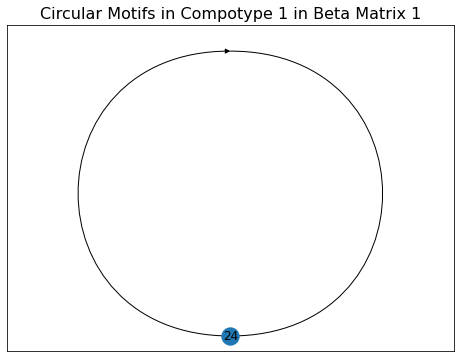

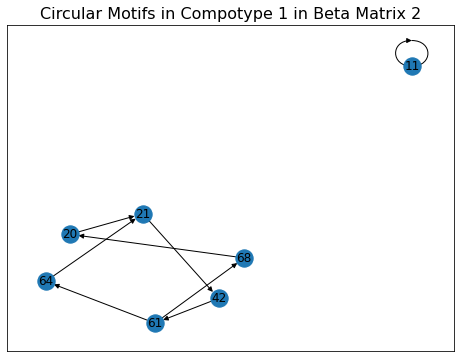

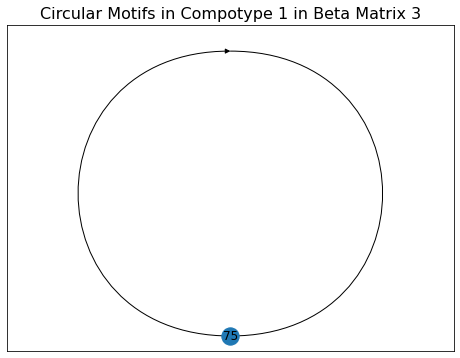

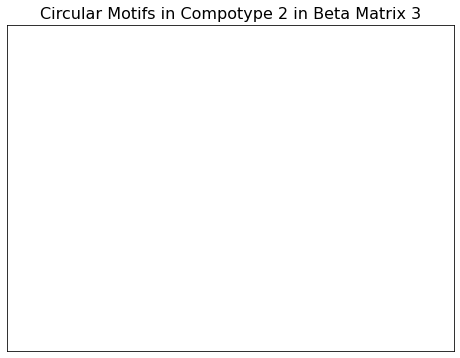

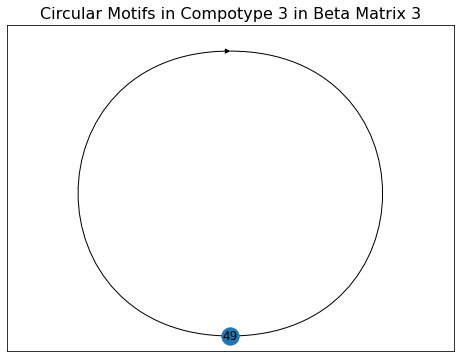

...

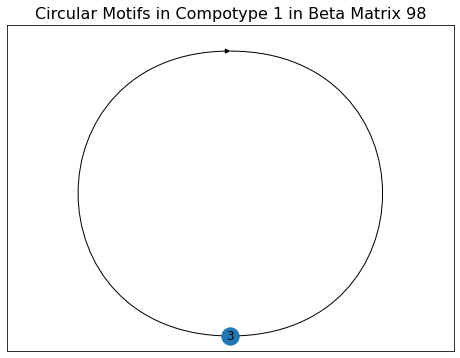

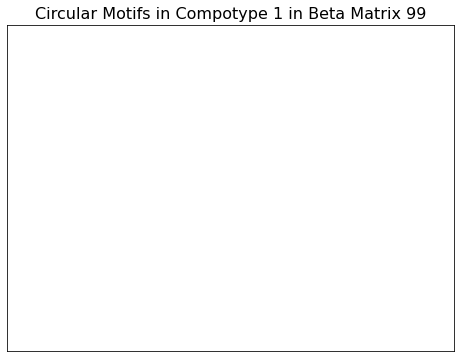

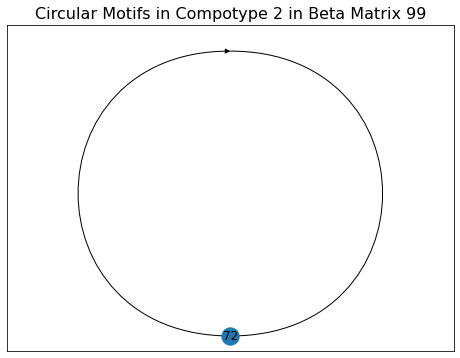

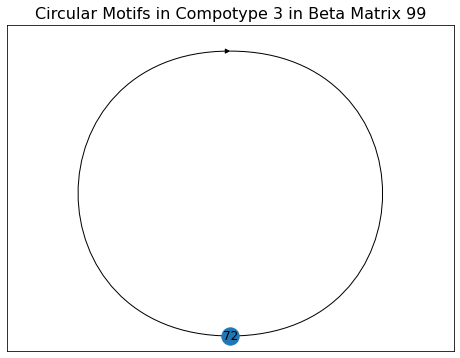

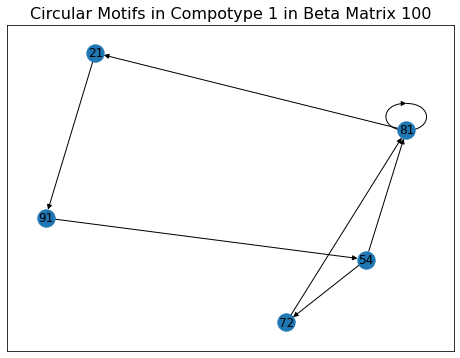

In [48]:
"""Let's say the threshold is 5%, how many of the cycles overlap?"""
# compotypes_amount = len(list(df_multiple_compotypes.columns)) + len(list(df_compotypes))
threshold_choose = 5   # in percentages



threshold = thresholds[xaxis_thresholds.index(threshold_choose) + 1]

# motifs_in_compotypes_sizes = []
for beta in range(1,101):
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)

    compotypes_nmols = []
    for comp_id in compotype_list_all:
        if "." in comp_id:
            comp_id_mod = comp_id.split(".")[0]
        else:
            comp_id_mod = comp_id
        if int(float(comp_id_mod)) == beta:
            compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
            nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
            compotypes_nmols.append(nmol_idxs)

    for compotype_counter, compotype in enumerate(compotypes_nmols):
        df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
        columns_list = list(df_beta_matrix_compotype.columns)
        # interaction = (column,row)
        columns_perm = list(permutations(columns_list, 2))
        same_columns_list = [(x,x) for x in columns_list]
        columns_perm.extend(same_columns_list)
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
        
        '''Option 1: draw the compotype'''
#         G = network_builder(available_interactions)
#         plt.figure(figsize=(8,6))
#         pos = nx.spring_layout(G, k=0.5)
#         nx.draw_networkx(G, arrows=True, pos=pos)

        '''Option 2: draw only the circles'''
        all_identified_cycles = cycles_identifier(available_interactions)
        interactions_in_cycles = []
        for cycle in all_identified_cycles:
            if len(cycle) == 1:
                interaction = (cycle[0], cycle[0])
                interactions_in_cycles.append(interaction)
            else:
                for node_counter, node in enumerate(cycle):
                    if node_counter == len(cycle)-1:
                        interaction = (node, cycle[0])
                    else:
                        interaction = (node,cycle[node_counter+1])
                    interactions_in_cycles.append(interaction)
        
        G = network_builder(interactions_in_cycles)
        plt.figure(figsize=(8,6))
        pos = nx.spring_layout(G, k=0.5)
        nx.draw_networkx(G, arrows=True, pos=pos)
        plt.title("Circular Motifs in Compotype " + str(compotype_counter+1) + " in Beta Matrix " + str(beta), fontsize=16)
                    
        
'''Optional parameters, not needed'''
#         node_sizes = [3 + 10 * i for i in range(len(G))]
#         M = G.number_of_edges()
#         edge_colors = range(2, M + 2)
#         edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
#         cmap = plt.cm.plasma

#         nodes = nx.draw_networkx_nodes(G, pos, node_color="indigo")
#         edges = nx.draw_networkx_edges(G, pos, arrowstyle="->", arrowsize=10, width=2)

In [211]:
'''Catalytic Closure - for each beta, find the threshold that makes the beta catalitically closed'''
percent_gap = 0.1
thresholds = []
all_betas_list = sorted(list(beta_matrices_values_all_list_array))
amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)

closure_threshold_list = []
closure_threshold_percentages_list = []
for beta in range(1,101):
    if beta % 20 == 0:
        print(beta)
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    columns_list = list(df_beta_matrix.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        available_interactions_rows_set = set([y for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold])
        if available_interactions_rows_set == columns_set:
            closure_threshold_list.append(threshold)
            closure_threshold_percentage = round((percent_gap)*(1+threshold_counter),2)
            closure_threshold_percentages_list.append(closure_threshold_percentage)
            break


'''Now the same with the first cycle'''
cycle_threshold_list = []
cycle_threshold_percentages_list = []
for beta in range(1,101):
    if beta % 20 == 0:
        print(beta)
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    columns_list = list(df_beta_matrix.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold]
        all_identified_cycles = cycles_identifier(available_interactions)
        if all_identified_cycles != []:
            cycle_threshold_list.append(threshold)
            cycle_threshold_percentage = (percent_gap)*(1+threshold_counter)
            cycle_threshold_percentages_list.append(cycle_threshold_percentage)
            break

20
40
60
80


KeyboardInterrupt: 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anacond

Text(0, 0.5, 'Density')

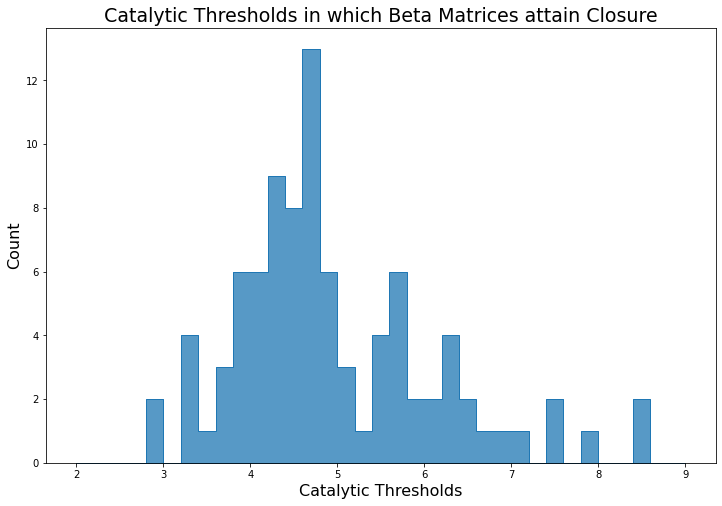

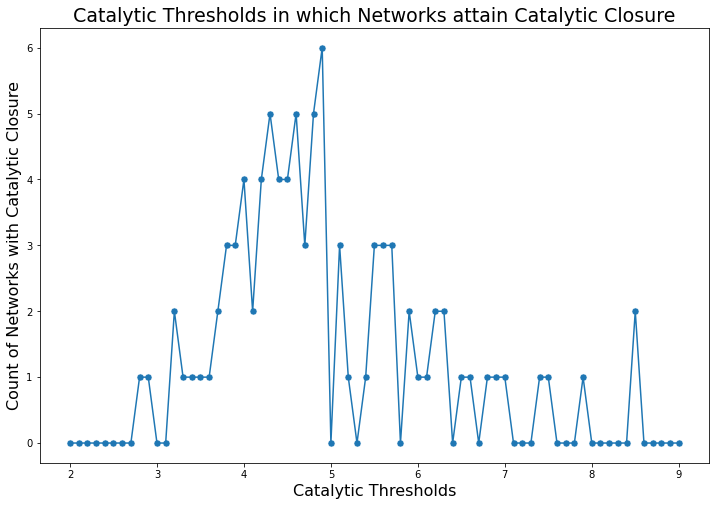

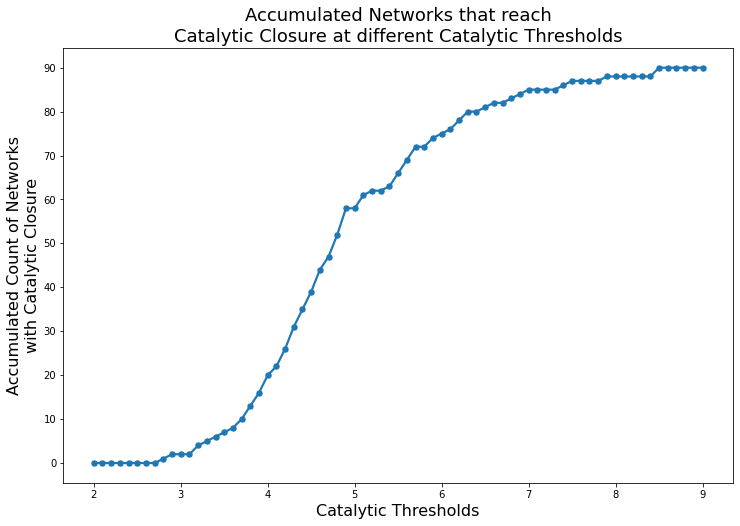

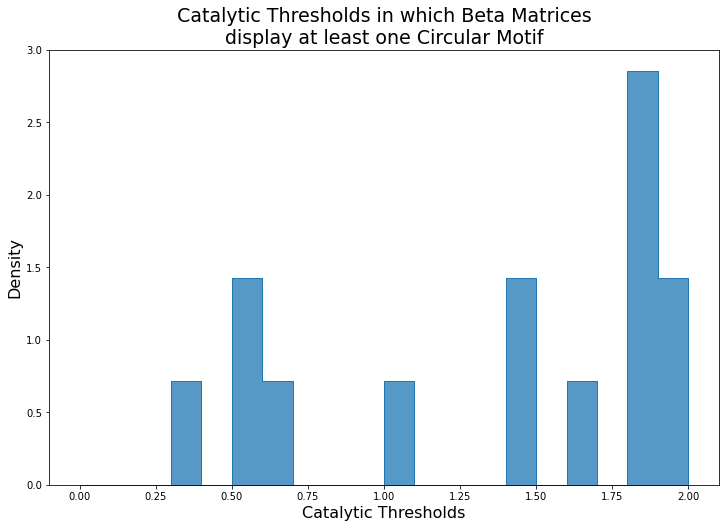

In [218]:
closure_threshold_percentages_list = [round(x,1) for x in closure_threshold_percentages_list]

"""Now, let's set the plot"""
plt.figure(figsize=(12,8))
sns.histplot(closure_threshold_percentages_list, element="step", bins=35, binrange=(2,9))
plt.title("Catalytic Thresholds in which Beta Matrices attain Closure", fontsize=19)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Count", fontsize=16)

"""Now lets plot this in scatter, 2%-9%, both regular and accumulated counts"""
threshold_base = 2 # in %
threshold_cap = 9 # in %
threshold_step = 0.1

thresholds_list = list(np.array(range(int(threshold_base/threshold_step),int((threshold_cap+threshold_step+threshold_step)/threshold_step)))*threshold_step)
betas_with_closure_counts_list = []
accumulated_betas_with_closure_counts_list = []
beta_matrix_accumulation = 0
for threshold_counter, threshold in enumerate(thresholds_list):
    threshold = round(threshold,1)
    betas_with_closure_count = closure_threshold_percentages_list.count(threshold)
    betas_with_closure_counts_list.append(betas_with_closure_count)
    beta_matrix_accumulation += betas_with_closure_count
    accumulated_betas_with_closure_counts_list.append(beta_matrix_accumulation)

plt.figure(figsize=(12,8))
sns.scatterplot(thresholds_list,betas_with_closure_counts_list,s=50)
sns.lineplot(thresholds_list,betas_with_closure_counts_list)
plt.title("Catalytic Thresholds in which Networks attain Catalytic Closure", fontsize=19)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Count of Networks with Catalytic Closure", fontsize=16)

plt.figure(figsize=(12,8))
sns.scatterplot(thresholds_list,accumulated_betas_with_closure_counts_list,s=50)
sns.lineplot(thresholds_list,accumulated_betas_with_closure_counts_list,linewidth = 2.2)
plt.title("Accumulated Networks that reach\nCatalytic Closure at different Catalytic Thresholds", fontsize=18)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Accumulated Count of Networks\nwith Catalytic Closure", fontsize=16)
plt.yticks(np.arange(min(accumulated_betas_with_closure_counts_list), max(accumulated_betas_with_closure_counts_list)+1, 10.0))

"""Now, let's set the plot"""
plt.figure(figsize=(12,8))
sns.histplot(cycle_threshold_percentages_list, stat="density", element="step", bins=20, binrange=(0,2))
plt.title("Catalytic Thresholds in which Beta Matrices\ndisplay at least one Circular Motif", fontsize=19)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Density", fontsize=16)

In [201]:
'''Catalytic Closure - for each beta, find the threshold that makes the compotype catalytically closed'''
percent_gap = 1
thresholds = []
all_betas_list = sorted(list(all_compotypes_array))
amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)
compotype_list_all = list(df_all_compotypes.columns)

closure_threshold_list = []
closure_threshold_percentages_list = []

compotypes_nmols = []
for comp_id in compotype_list_all:
    print(comp_id)
    if "." in comp_id:
        comp_id_mod = comp_id.split(".")[0]
    else:
        comp_id_mod = comp_id
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(int(float(comp_id_mod))) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
    columns_list = list(df_beta_matrix_compotype.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        available_interactions_rows_set = set([y for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold])
        if available_interactions_rows_set == columns_set:
            closure_threshold_list.append(threshold)
            closure_threshold_percentage = round((percent_gap)*(1+threshold_counter),2)
            closure_threshold_percentages_list.append(closure_threshold_percentage)
            break


percent_gap = 0.1
thresholds_cycles = []
all_betas_list = sorted(list(all_compotypes_array))
amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds_cycles.append(val_at_cutoff)
thresholds_cycles = np.exp(thresholds_cycles)

'''Now the same with the first cycle'''
cycle_threshold_list = []
cycle_threshold_percentages_list = []
compotypes_nmols = []
for comp_id in compotype_list_all:
    print(comp_id)
    if "." in comp_id:
        comp_id_mod = comp_id.split(".")[0]
    else:
        comp_id_mod = comp_id
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(int(float(comp_id_mod))) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
    columns_list = list(df_beta_matrix_compotype.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds_cycles):
        # interaction = (column,row)
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
        all_identified_cycles = cycles_identifier(available_interactions)
        if all_identified_cycles != []:
            cycle_threshold_list.append(threshold)
            cycle_threshold_percentage = (percent_gap)*(1+threshold_counter)
            cycle_threshold_percentages_list.append(cycle_threshold_percentage)
            break

1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100
3
3.1
3.2
4
4.1
4.2
5
5.1
7
7.1
7.2
9
9.1
9.2
10
10.1
10.2
10.3
11
11.1
11.2
12
12.1
12.2
14
14.1
16
16.1
16.2
16.3
17
17.1
20
20.1
23
23.1
24
24.1
24.2
25
25.1
28
28.1
28.2
32
32.1
33
33.1
33.2
37
37.1
41
41.1
42
42.1
42.2
42.3
45
45.1
45.2
47
47.1
48
48.1
48.2
48.3
52
52.1
54
54.1
55
55.1
55.2
59
59.1
59.2
59.3
59.4
60
60.1
61
61.1
61.2
62
62.1
63
63.1
65
65.1
65.2
65.3
65.4
67
67.1
67.2
67.3
68
68.1
68.2
70
70.1
71
71.1
71.2
72
72.1
72.2
72.3
72.4
73
73.1
74
74.1
74.2
74.3
76
76.1
77
77.1
77.2
78
78.1
79
79.1
81
81.1
83
83.1
85
85.1
85.2
86
86.1
88
88.1
90
90.1
94
94.1
94.2
94.3
95
95.1
99
99.1
99.2
1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100
3
3.1
3.2
4
4.1
4.2
5
5.1
7
7.1
7.2
9
9.1
9.2
10
10.1
10.2
10.3
11
11.1
11.2
12
12.1
12.2
14
14.1
16
16.1
16.2
16.3
17
1

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anacond

Text(0, 0.5, 'Compotype Count with at least one cycle')

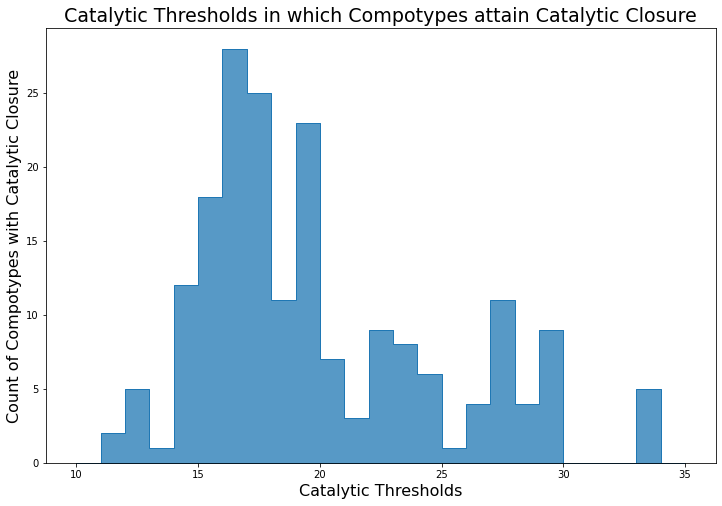

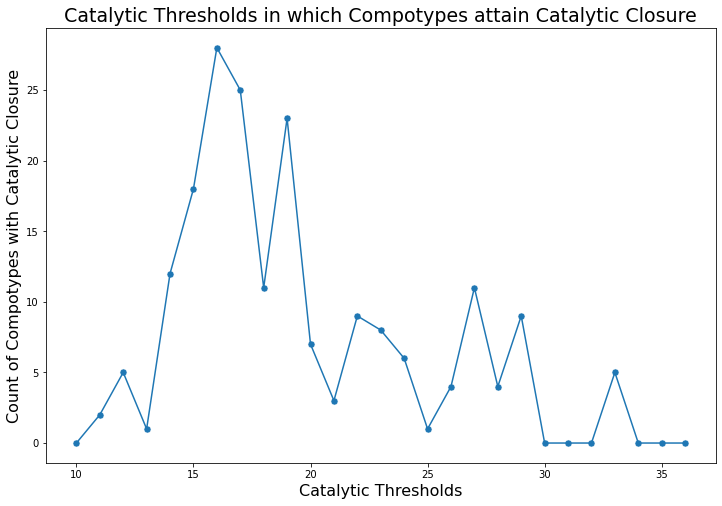

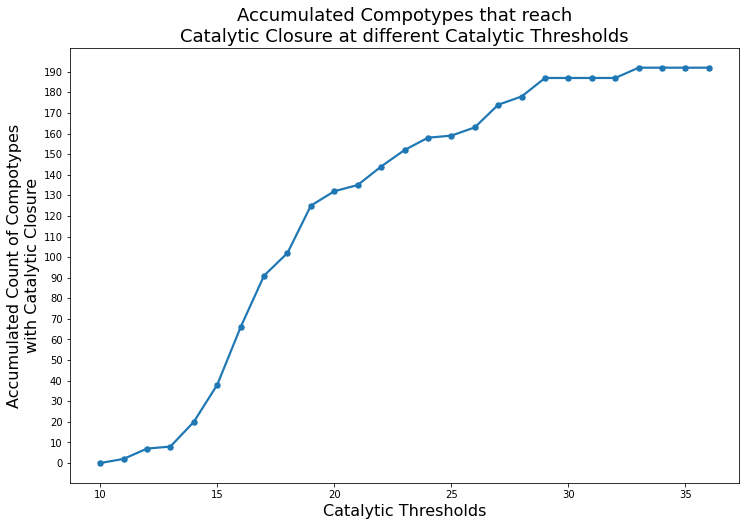

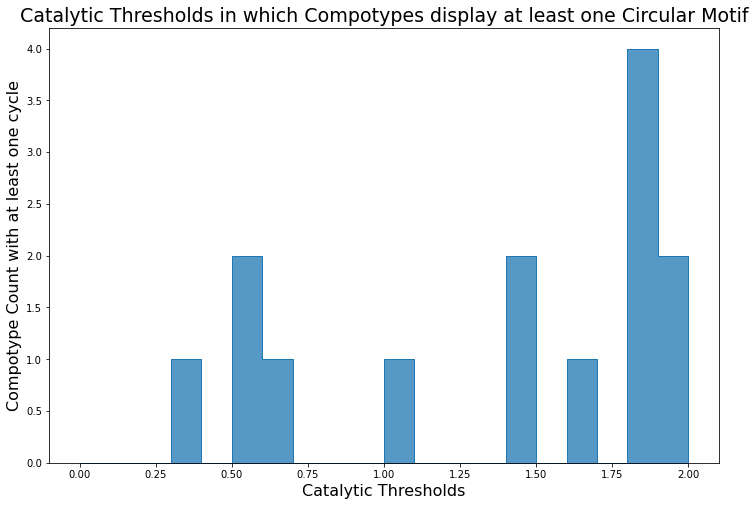

In [208]:
closure_threshold_percentages_list = [round(x,1) for x in closure_threshold_percentages_list]

"""Now, let's set the plot"""
plt.figure(figsize=(12,8))
sns.histplot(closure_threshold_percentages_list, element="step", bins=25, binrange=(10,35))
plt.title("Catalytic Thresholds in which Compotypes attain Catalytic Closure", fontsize=19)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Count of Compotypes with Catalytic Closure", fontsize=16)

"""Now lets plot this in scatter, 2%-9%, both regular and accumulated counts"""
threshold_base = 10 # in %
threshold_cap = 35 # in %
threshold_step = 1

thresholds_list = list(np.array(range(int(threshold_base/threshold_step),int((threshold_cap+threshold_step+threshold_step)/threshold_step)))*threshold_step)
betas_with_closure_counts_list = []
accumulated_betas_with_closure_counts_list = []
beta_matrix_accumulation = 0
for threshold_counter, threshold in enumerate(thresholds_list):
    threshold = round(threshold,1)
    betas_with_closure_count = closure_threshold_percentages_list.count(threshold)
    betas_with_closure_counts_list.append(betas_with_closure_count)
    beta_matrix_accumulation += betas_with_closure_count
    accumulated_betas_with_closure_counts_list.append(beta_matrix_accumulation)

plt.figure(figsize=(12,8))
sns.scatterplot(thresholds_list,betas_with_closure_counts_list,s=50)
sns.lineplot(thresholds_list,betas_with_closure_counts_list)
plt.title("Catalytic Thresholds in which Compotypes attain Catalytic Closure", fontsize=19)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Count of Compotypes with Catalytic Closure", fontsize=16)

plt.figure(figsize=(12,8))
sns.scatterplot(thresholds_list,accumulated_betas_with_closure_counts_list,s=50)
sns.lineplot(thresholds_list,accumulated_betas_with_closure_counts_list,linewidth = 2.2)
plt.title("Accumulated Compotypes that reach\nCatalytic Closure at different Catalytic Thresholds", fontsize=18)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Accumulated Count of Compotypes\nwith Catalytic Closure", fontsize=16)
plt.yticks(np.arange(min(accumulated_betas_with_closure_counts_list), max(accumulated_betas_with_closure_counts_list)+1, 10.0))

"""Now, let's set the plot"""
plt.figure(figsize=(12,8))
sns.histplot(cycle_threshold_percentages_list, element="step", bins=20, binrange=(0,2))
plt.title("Catalytic Thresholds in which Compotypes display at least one Circular Motif", fontsize=19)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Compotype Count with at least one cycle", fontsize=16)

########## Beta 1
########## Beta 2
########## Beta 6
########## Beta 8
########## Beta 13
########## Beta 15


<ipython-input-123-c20e226ae89c>:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


########## Beta 18
########## Beta 19
########## Beta 21
########## Beta 22
########## Beta 26
########## Beta 27
########## Beta 29
########## Beta 30
########## Beta 31
########## Beta 34
########## Beta 35
########## Beta 36
########## Beta 38
########## Beta 39
########## Beta 40
########## Beta 43
########## Beta 44
########## Beta 46
########## Beta 49
########## Beta 50
########## Beta 51
########## Beta 53
########## Beta 56
########## Beta 57
########## Beta 58
########## Beta 64
########## Beta 66
########## Beta 69
########## Beta 80
########## Beta 82
########## Beta 84
########## Beta 87
########## Beta 89
########## Beta 91
########## Beta 92
########## Beta 93
########## Beta 96
########## Beta 97
########## Beta 98
########## Beta 100


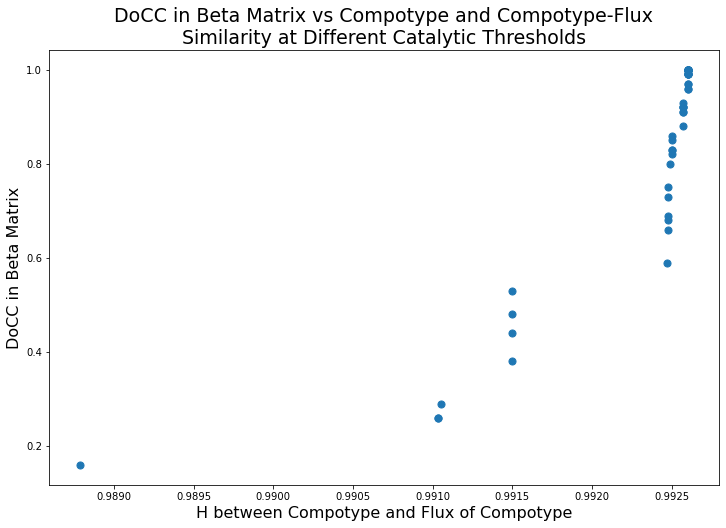

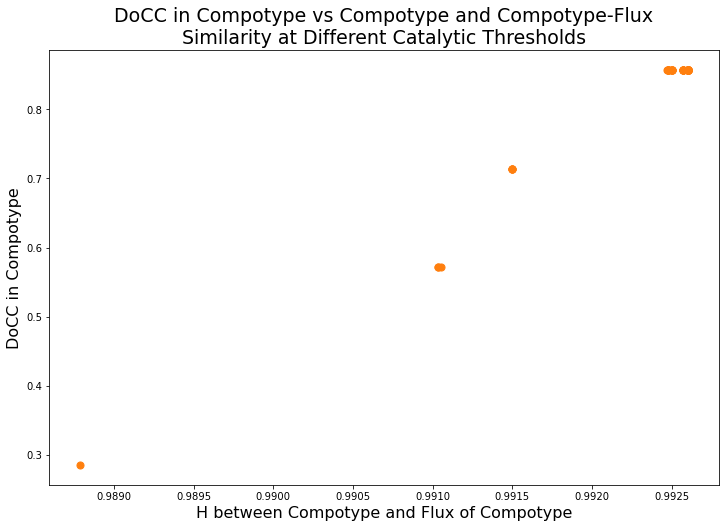

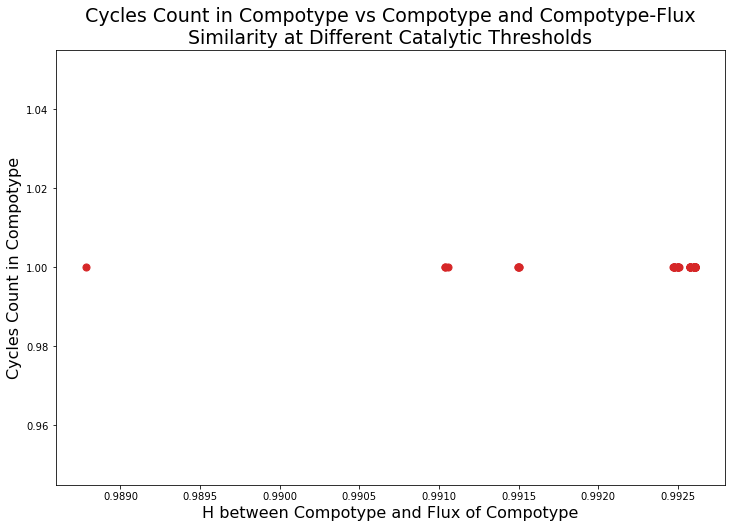

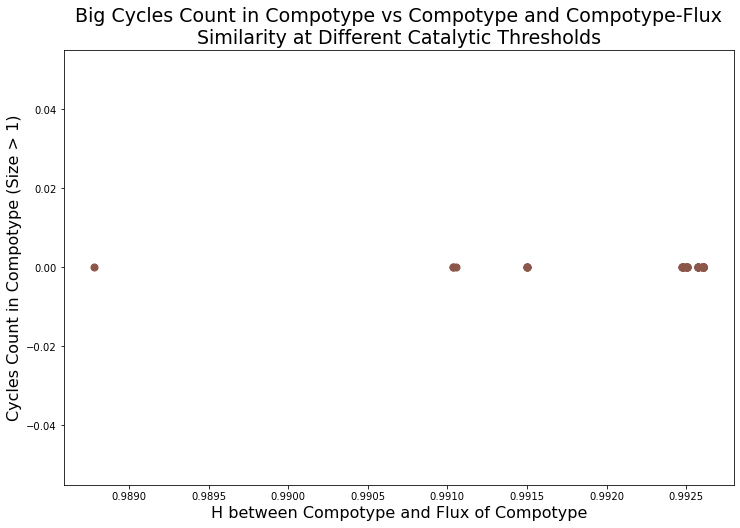

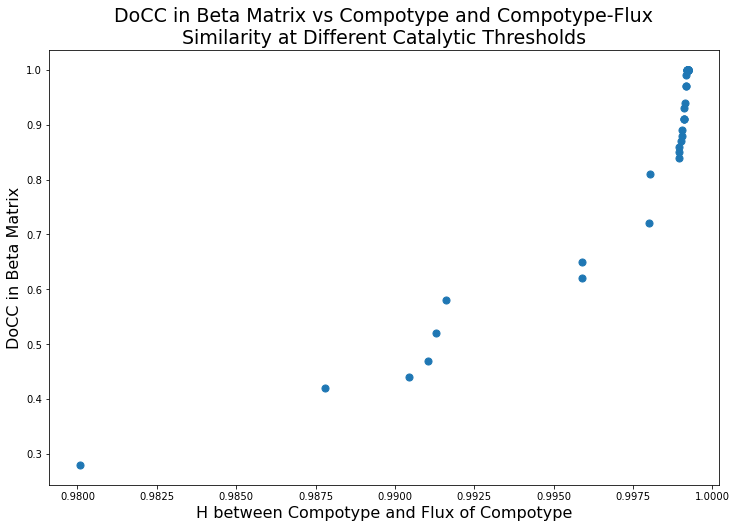

...

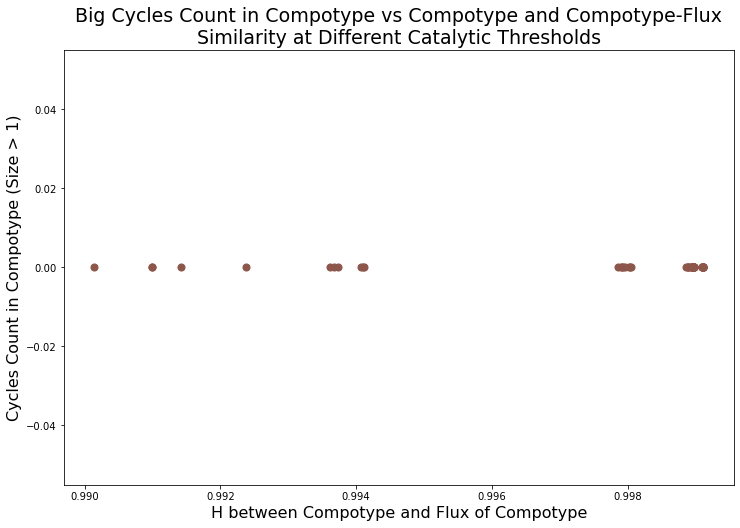

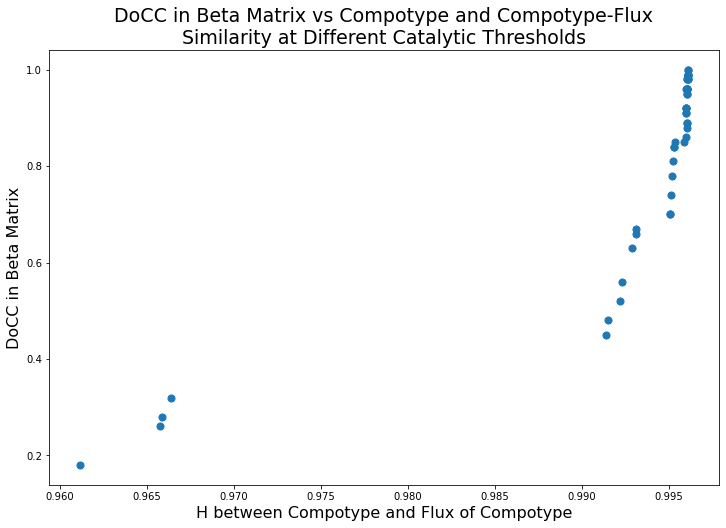

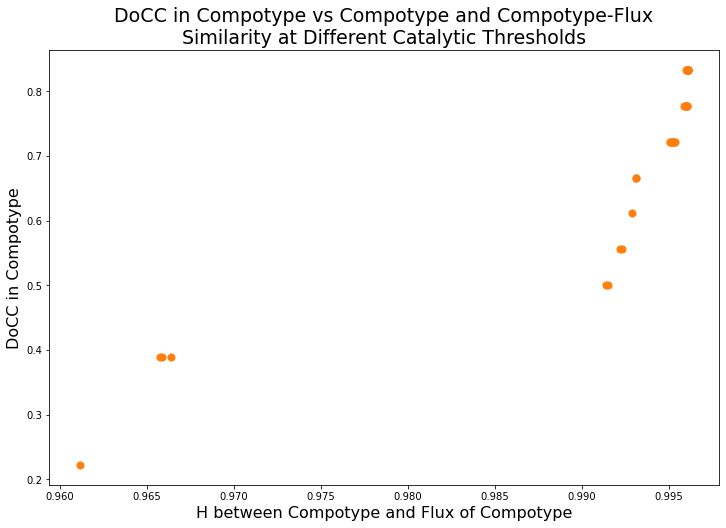

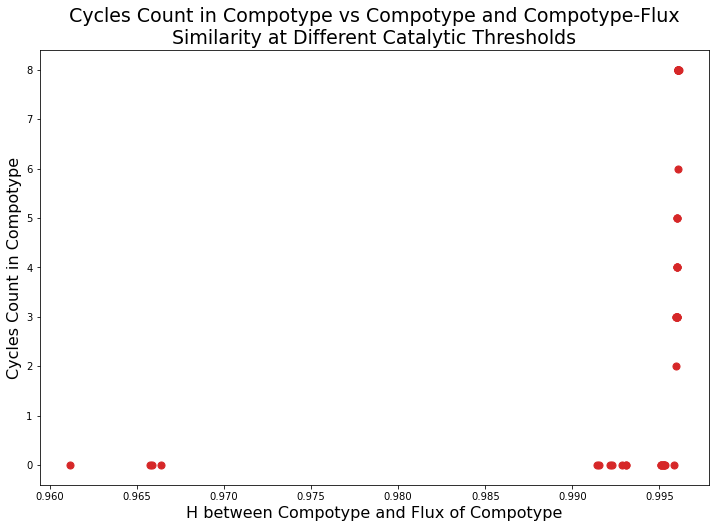

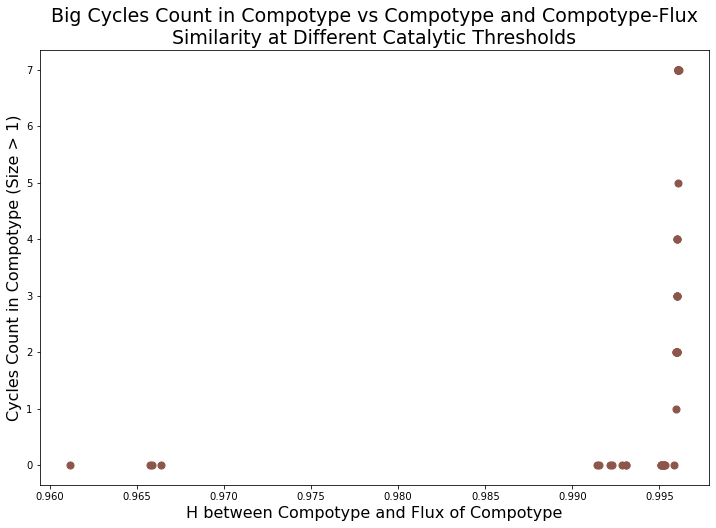

In [123]:
"""For beta with single compotype, do multipl threshold (up to 10%) and show correlation between compotype and its flux
    while aacounting for the threshold (only above thrshold betas included in flux analysis). Do DoCC as fraction of
    catalytic closure, amount of cycles, and amount of size>1 cycles"""
# threholds are defined before as thresholds[:thresholds_amount_choose]
percent_gap = 0.1
thresholds_amount_choose = 50


thresholds = []
all_betas_list = sorted(list(comptypes_values_list_array))
amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)

for beta in betas:
    print('########## Beta ' + str(beta))
    df_beta_matrix = pd.read_csv('C:\\Users\\amitka\\Box Sync\\B-OOLf\\Pap425 Attractor GARD in messy environment\\AAA Pap425 simulations\\GARD Simulation Project AK\\Single Compotype Experiments\\Beta ' + str(beta) + '\\df_beta_matrix.csv')
    compotype = list(df_compotypes[str(beta)])
    compotype_bool = nmol_transform(compotype)
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[nmol_idxs,nmol_idxs]
    
    '''beta_matix columns'''
    columns_list = list(df_beta_matrix.columns)
    columns_list = [int(float(x)) for x in columns_list]
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    
    '''compotype_beta matrix columns'''
    columns_list_compt = list(df_beta_matrix_compotype.columns)
    columns_list_compt = [int(float(x)) for x in columns_list_compt]
    columns_set_compt = set(columns_list_compt)
    columns_perm_compt = list(permutations(columns_list_compt, 2))
    same_columns_list_compt = [(x,x) for x in columns_list_compt]
    columns_perm_compt.extend(same_columns_list_compt)
    
    docc_beta_list_per_beta = []
    docc_compotype_list_per_beta = []
    cycles_amount_beta_per_beta = []
    cycles_amount_compotype_per_beta = []
    cycles_amount_not_ones_beta_per_beta = []
    cycles_amount_not_ones_compotype_per_beta = []
    flux_compotype_H_list_per_beta = []
    
    for threshold_counter, threshold in enumerate(thresholds[:thresholds_amount_choose]):
#         print(threshold_counter+1, threshold)
        '''################ DoCC'''
        '''beta'''
        available_interactions_rows = list(set([y for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold]))
        docc_beta = len(available_interactions_rows) / len(columns_list)
        docc_beta_list_per_beta.append(docc_beta)
        '''compotype'''
        available_interactions_rows_compotype = list(set([y for x,y in columns_perm_compt if df_beta_matrix_compotype.loc[y,str(x)] >= threshold]))
        docc_compt = len(available_interactions_rows_compotype) / len(columns_list_compt)
        docc_compotype_list_per_beta.append(docc_compt)
        
        '''################ Cycles'''
#         '''beta'''
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold]
#         all_identified_cycles = cycles_identifier(available_interactions)
#         cycles_amount_beta = len(all_identified_cycles)
#         cycles_amount_beta_per_beta.append(cycles_amount_beta)
#         all_identified_cycles_not_ones = [x for x in all_identified_cycles if len(x) > 1]
#         cycles_amount_not_ones_beta = len(all_identified_cycles_not_ones)
#         cycles_amount_not_ones_beta_per_beta.append(cycles_amount_not_ones_beta)
        '''compotype'''
        available_interactions_compt = [(x,y) for x,y in columns_perm_compt if df_beta_matrix_compotype.loc[y,str(x)] >= threshold]
        all_identified_cycles_compt = cycles_identifier(available_interactions_compt)
        cycles_amount_compt = len(all_identified_cycles_compt)
        cycles_amount_compotype_per_beta.append(cycles_amount_compt)
        all_identified_cycles_not_ones_compt = [x for x in all_identified_cycles_compt if len(x) > 1]
        cycles_amount_not_ones_compt = len(all_identified_cycles_not_ones_compt)
        cycles_amount_not_ones_compotype_per_beta.append(cycles_amount_not_ones_compt)
        
        '''############### Compotype flux'''
        df_beta_matrix_mod_threshold = np.zeros((df_beta_matrix.shape[0], df_beta_matrix.shape[1]))
        df_beta_matrix_mod_threshold = pd.DataFrame(df_beta_matrix_mod_threshold)
        for interaction in available_interactions:
            df_beta_matrix_mod_threshold.iloc[interaction[1], interaction[0]] = df_beta_matrix.iloc[interaction[1], interaction[0]]
        calculated_flux = flux_calculation(df_beta_matrix_mod_threshold, compotype)
        H_compt_flux_mod = H_solver(compotype, calculated_flux)
        flux_compotype_H_list_per_beta.append(H_compt_flux_mod)
        
        
    '''Fig1 - docc beta & compotype flux H'''    
    plt.figure(figsize=(12,8))
    plt.scatter(flux_compotype_H_list_per_beta,docc_beta_list_per_beta, s=50, color = current_palette[0])
    plt.xlabel('H between Compotype and Flux of Compotype',fontsize=16)
    plt.ylabel('DoCC in Beta Matrix',fontsize=16)
    plt.title('DoCC in Beta Matrix vs Compotype and Compotype-Flux\nSimilarity at Different Catalytic Thresholds', fontsize=19)
    
    '''Fig2 - docc compt & compotype flux H'''    
    plt.figure(figsize=(12,8))
    plt.scatter(flux_compotype_H_list_per_beta,docc_compotype_list_per_beta, s=50, color=current_palette[1])
    plt.xlabel('H between Compotype and Flux of Compotype',fontsize=16)
    plt.ylabel('DoCC in Compotype',fontsize=16)
    plt.title('DoCC in Compotype vs Compotype and Compotype-Flux\nSimilarity at Different Catalytic Thresholds', fontsize=19)
    
#     '''Fig3 - cycles amount beta & compotype flux H'''    
#     plt.figure(figsize=(12,8))
#     plt.scatter(flux_compotype_H_list_per_beta,cycles_amount_beta_per_beta, s=50, color=current_palette[2])
#     plt.xlabel('H between Compotype and Flux of Compotype',fontsize=16)
#     plt.ylabel('Cycles Count in Beta Matrix',fontsize=16)
#     plt.title('Cycles Count in Beta Matrix vs Compotype and Compotype-Flux\nSimilarity at Different Catalytic Thresholds', fontsize=19)
    
    '''Fig4 - cycles amount compotype & compotype flux H'''
    plt.figure(figsize=(12,8))
    plt.scatter(flux_compotype_H_list_per_beta,cycles_amount_compotype_per_beta, s=50, color=current_palette[3])
    plt.xlabel('H between Compotype and Flux of Compotype',fontsize=16)
    plt.ylabel('Cycles Count in Compotype',fontsize=16)
    plt.title('Cycles Count in Compotype vs Compotype and Compotype-Flux\nSimilarity at Different Catalytic Thresholds', fontsize=19)
    
#     '''Fig5 - cycles amount not ones beta & compotype flux H'''
#     plt.figure(figsize=(12,8))
#     plt.scatter(flux_compotype_H_list_per_beta,cycles_amount_not_ones_beta_per_beta, s=50, color=current_palette[4])
#     plt.xlabel('H between Compotype and Flux of Compotype',fontsize=16)
#     plt.ylabel('Cycles Count in Beta Matrix (Size > 1)',fontsize=16)
#     plt.title('Big Cycles Count in Beta Matrix vs Compotype and Compotype-Flux\nSimilarity at Different Catalytic Thresholds', fontsize=19)
    
    '''Fig6 - cycles amount not ones compotype & compotype flux H'''
    plt.figure(figsize=(12,8))
    plt.scatter(flux_compotype_H_list_per_beta,cycles_amount_not_ones_compotype_per_beta, s=50, color=current_palette[5])
    plt.xlabel('H between Compotype and Flux of Compotype',fontsize=16)
    plt.ylabel('Cycles Count in Compotype (Size > 1)',fontsize=16)
    plt.title('Big Cycles Count in Compotype vs Compotype and Compotype-Flux\nSimilarity at Different Catalytic Thresholds', fontsize=19)
    

In [280]:
'''DoCC (Degrees of Catalytic Closure) of Beta Matrices'''
percent_gap_docc = 0.1
amount_of_thresholds_choose = 200
thresholds_docc = []
all_betas_list = sorted(list(beta_matrices_values_all_list_array))
amount_gap = int(percent_gap_docc*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap_docc))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds_docc.append(val_at_cutoff)
thresholds_docc = np.exp(thresholds_docc)


docc_dict = {}  #
for threshold_counter, threshold in enumerate(thresholds_docc[:amount_of_thresholds_choose]):
    docc_dict[threshold] = []
for beta in range(1,101):
    print(beta)
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    columns_list = list(df_beta_matrix.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds_docc[:amount_of_thresholds_choose]):
#         print(threshold_counter+1, threshold)    
        available_interactions_rows_set = list(set([y for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold]))
        docc = len(available_interactions_rows_set) / len(columns_list)
        docc_dict[threshold].append(docc)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anacond

(-2.0, 102.0)

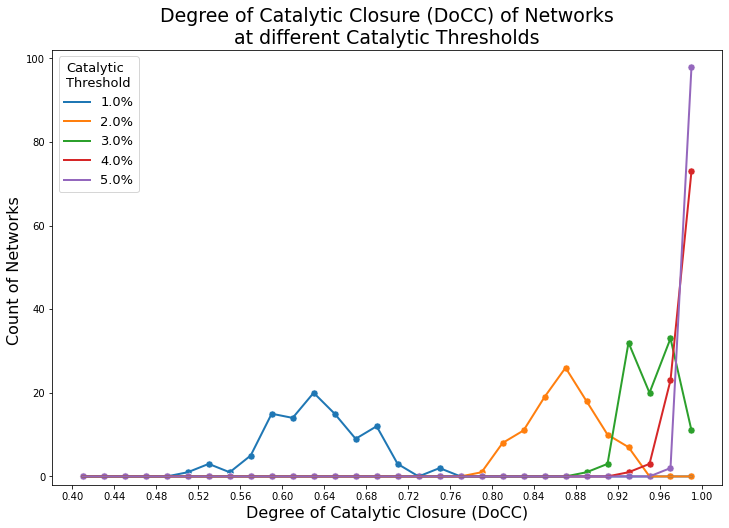

In [281]:
'''SCATTER WITH THRESHOLDS 6%-10%'''
docc_cap = 1
docc_base = 0.4
docc_step = 0.02
thresholds_amount_choose = 50
normalize_by_beta = True
plt.figure(figsize=(12,8))

thresholds_list = [x for x,y in enumerate(docc_dict.keys())]
for threshold_pos in range(9,thresholds_amount_choose,10):
    recorded_docc_values_per_threshold = docc_dict[list(docc_dict.keys())[threshold_pos]]
#     print(len(recorded_docc_values_per_threshold))
    docc_list = np.array(list(range(round(docc_base/docc_step),round((docc_cap+docc_step)/docc_step))))*docc_step
    docc_count_list = []
    bin_centers = []
    for docc_counter, docc in enumerate(docc_list):
        if docc_counter == 0:
            continue
        bin_center = (docc + docc_list[docc_counter-1]) / 2
        bin_centers.append(bin_center)
        counting_value = 0
        for docc_value_counter, docc_value in enumerate(recorded_docc_values_per_threshold):
            if docc_counter == len(docc_list) - 1:
                if docc_value <= docc and docc_value >= docc_list[docc_counter-1]:
                    counting_value += 1
            else:
                if docc_value < docc and docc_value >= docc_list[docc_counter-1]:
                    counting_value += 1
        docc_count_list.append(counting_value)
    
    sns.scatterplot(bin_centers,docc_count_list,s=50)
    sns.lineplot(bin_centers,docc_count_list, label=str((threshold_pos+1)*percent_gap_docc) + "%", linewidth=2)
    
    
plt.title("Degree of Catalytic Closure (DoCC) of Networks\nat different Catalytic Thresholds", fontsize=19)
plt.xlabel("Degree of Catalytic Closure (DoCC)", fontsize=16)
plt.ylabel("Count of Networks ", fontsize=16)
plt.legend(title="Catalytic\nThreshold",title_fontsize=13,fontsize=13)
plt.xticks(np.arange(min(bin_centers)-(docc_step/2), max(bin_centers)+docc_step+docc_step/2, docc_step*2))
plt.ylim(-2,102)

In [326]:
'''DoCC (Degrees of Catalytic Closure) of Compotypes'''
percent_gap_docc = 0.01
amount_of_thresholds_choose = 1000
thresholds_docc = []
all_betas_list = sorted(list(all_compotypes_array))
amount_gap = int(percent_gap_docc*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap_docc))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds_docc.append(val_at_cutoff)
thresholds_docc = np.exp(thresholds_docc)

docc_dict = {}  #
for threshold_counter, threshold in enumerate(thresholds_docc[:amount_of_thresholds_choose]):
    docc_dict[threshold] = []
for comp_id in compotype_list_all:
    print(comp_id)
    if "." in comp_id:
        comp_id_mod = comp_id.split(".")[0]
    else:
        comp_id_mod = comp_id
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(int(float(comp_id_mod))) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
    columns_list = list(df_beta_matrix_compotype.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds_docc[:amount_of_thresholds_choose]):
#         print(threshold_counter+1, threshold)    
        available_interactions_rows_set = list(set([y for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]))
        docc = len(available_interactions_rows_set) / len(columns_list)
        docc_dict[threshold].append(docc)

1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100
3
3.1
3.2
4
4.1
4.2
5
5.1
7
7.1
7.2
9
9.1
9.2
10
10.1
10.2
10.3
11
11.1
11.2
12
12.1
12.2
14
14.1
16
16.1
16.2
16.3
17
17.1
20
20.1
23
23.1
24
24.1
24.2
25
25.1
28
28.1
28.2
32
32.1
33
33.1
33.2
37
37.1
41
41.1
42
42.1
42.2
42.3
45
45.1
45.2
47
47.1
48
48.1
48.2
48.3
52
52.1
54
54.1
55
55.1
55.2
59
59.1
59.2
59.3
59.4
60
60.1
61
61.1
61.2
62
62.1
63
63.1
65
65.1
65.2
65.3
65.4
67
67.1
67.2
67.3
68
68.1
68.2
70
70.1
71
71.1
71.2
72
72.1
72.2
72.3
72.4
73
73.1
74
74.1
74.2
74.3
76
76.1
77
77.1
77.2
78
78.1
79
79.1
81
81.1
83
83.1
85
85.1
85.2
86
86.1
88
88.1
90
90.1
94
94.1
94.2
94.3
95
95.1
99
99.1
99.2


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anacond

(0.0, 1.0)

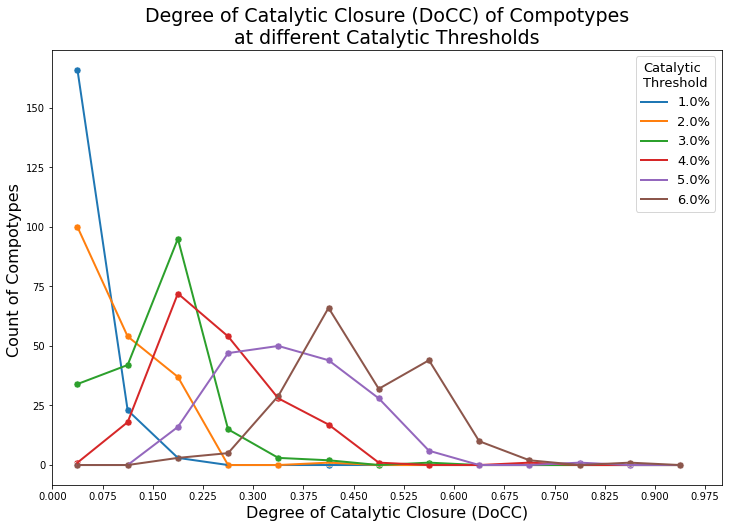

In [340]:
'''SCATTER WITH THRESHOLDS 6%-10%'''
docc_cap = 1
docc_base = 0
docc_step = 0.075
thresholds_amount_choose = 600
normalize_by_beta = True
plt.figure(figsize=(12,8))

thresholds_list = [x for x,y in enumerate(docc_dict.keys())]
for threshold_pos in range(99,thresholds_amount_choose,round(1/percent_gap_docc)):
    recorded_docc_values_per_threshold = docc_dict[list(docc_dict.keys())[threshold_pos]]
#     print(len(recorded_docc_values_per_threshold))
    docc_list = np.array(list(range(round(docc_base/docc_step),round((docc_cap+docc_step)/docc_step))))*docc_step
    docc_count_list = []
    bin_centers = []
    for docc_counter, docc in enumerate(docc_list):
        if docc_counter == 0:
            continue
        bin_center = (docc + docc_list[docc_counter-1]) / 2
        bin_centers.append(bin_center)
        counting_value = 0
        for docc_value_counter, docc_value in enumerate(recorded_docc_values_per_threshold):
            if docc_counter == len(docc_list) - 1:
                if docc_value <= docc and docc_value >= docc_list[docc_counter-1]:
                    counting_value += 1
            else:
                if docc_value < docc and docc_value >= docc_list[docc_counter-1]:
                    counting_value += 1
        counting_value = round(counting_value,2)
        docc_count_list.append(counting_value)
    
    sns.scatterplot(bin_centers,docc_count_list,s=50)
    sns.lineplot(bin_centers,docc_count_list, label=str((threshold_pos+1)*percent_gap_docc) + "%", linewidth=2)
    
    
plt.title("Degree of Catalytic Closure (DoCC) of Compotypes\nat different Catalytic Thresholds", fontsize=19)
plt.xlabel("Degree of Catalytic Closure (DoCC)", fontsize=16)
plt.ylabel("Count of Compotypes ", fontsize=16)
plt.legend(title="Catalytic\nThreshold",title_fontsize=13,fontsize=13)
plt.xticks(np.arange(min(bin_centers)-(docc_step/2), docc_cap + docc_step/2, docc_step))
plt.xlim(0,1)
# plt.ylim(-2,102)

In [343]:
'''Cycle Involvement of Compotypes'''
percent_gap_CI = 0.01
amount_of_thresholds_choose = 1000
thresholds_CI = []
all_betas_list = sorted(list(all_compotypes_array))
amount_gap = int(percent_gap_CI*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap_CI))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds_CI.append(val_at_cutoff)
thresholds_CI = np.exp(thresholds_CI)

CI_dict = {}  #
for threshold_counter, threshold in enumerate(thresholds_CI[:amount_of_thresholds_choose]):
    CI_dict[threshold] = []
for comp_id in compotype_list_all:
    print(comp_id)
    if "." in comp_id:
        comp_id_mod = comp_id.split(".")[0]
    else:
        comp_id_mod = comp_id
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor GARD in messy environment\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(int(float(comp_id_mod))) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_all_compotypes[str(comp_id)]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
    columns_list = list(df_beta_matrix_compotype.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds_CI[:amount_of_thresholds_choose]):
#         print(threshold_counter+1, threshold)    
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
        cycles_identified = cycles_identifier(available_interactions)
        '''find set of all cycle_involved lipids'''
        CI_lipids = []
        for cycle in cycles_identified:
            CI_lipids.extend(cycle)
        CI_lipids = list(set(CI_lipids))
        CI_value = len(CI_lipids) / len(columns_list)
        CI_dict[threshold].append(docc)

1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100
3
3.1
3.2
4
4.1
4.2
5
5.1
7
7.1
7.2
9
9.1
9.2
10
10.1
10.2
10.3
11
11.1
11.2
12
12.1
12.2
14
14.1
16
16.1
16.2
16.3
17
17.1
20
20.1
23
23.1
24
24.1
24.2
25
25.1
28
28.1
28.2
32
32.1
33
33.1
33.2
37
37.1
41
41.1
42
42.1
42.2
42.3
45
45.1
45.2
47
47.1
48
48.1
48.2
48.3
52
52.1
54
54.1
55
55.1
55.2
59
59.1
59.2
59.3
59.4
60
60.1
61
61.1
61.2
62
62.1
63
63.1
65
65.1
65.2
65.3
65.4
67
67.1
67.2
67.3
68
68.1
68.2
70
70.1
71
71.1
71.2
72
72.1
72.2
72.3
72.4
73
73.1
74
74.1
74.2
74.3
76
76.1
77
77.1
77.2
78
78.1
79
79.1
81
81.1
83
83.1
85
85.1
85.2
86
86.1
88
88.1
90
90.1
94
94.1
94.2
94.3
95
95.1
99
99.1
99.2


1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100
1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100
1
2
6
8
13
15
18
19
21
22
26
27
29
30
31
34
35
36
38
39
40
43
44
46
49
50
51
53
56
57
58
64
66
69
80
82
84
87
89
91
92
93
96
97
98
100


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


([<matplotlib.axis.YTick at 0x178e8d8bac0>,
 [Text(0, 0.0, '0'),
  Text(0, 0.1, '0.1'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.3, '0.3'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.5, '0.5'),
  Text(0, 0.6, '0.6'),
  Text(0, 0.7, '0.7'),
  Text(0, 0.8, '0.8'),
  Text(0, 0.9, '0.9'),
  Text(0, 1.0, '1')])

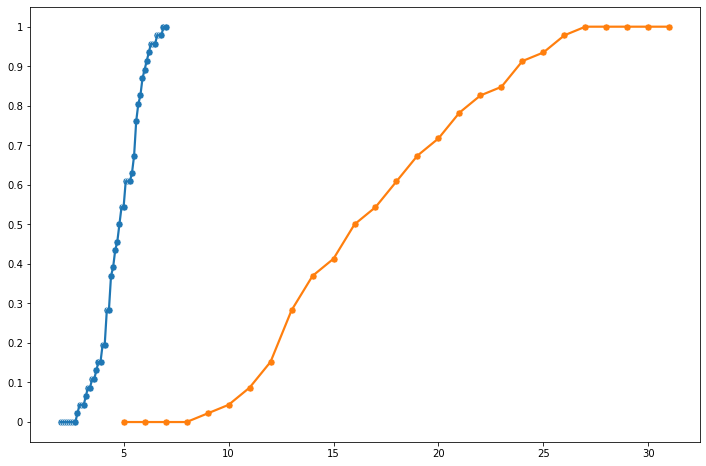

In [200]:
'''Catalytic Closure - for each beta, find the threshold that makes the beta catalitically closed'''
plt.figure(figsize=(12,8))
percent_gap = 0.1
thresholds = []

'''All betas'''
beta_matrices_singles_values_all_list = []
for beta in range(1,101):
    if beta not in betas:
        continue
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    beta_matrix_values_list_temp = df_beta_matrix.values.tolist()
    beta_matrix_values_list = []
    for temp_list in beta_matrix_values_list_temp:
        for val in temp_list:
            if val != 0:
                beta_matrix_values_list.append(val)
    del beta_matrix_values_list_temp
    beta_matrices_singles_values_all_list.extend(beta_matrix_values_list)

beta_matrices_singles_values_all_array = np.array(beta_matrices_singles_values_all_list)
beta_matrices_singles_values_all_array = np.log(beta_matrices_singles_values_all_array)

# all_betas_list = sorted(list(beta_matrices_values_all_list_array))
all_betas_list = sorted(list(beta_matrices_singles_values_all_array))

amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)

closure_threshold_list = []
closure_threshold_percentages_list = []
for beta in range(1,101):
    if beta not in betas:
        continue
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    columns_list = list(df_beta_matrix.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        available_interactions_rows_set = set([y for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold])
        if available_interactions_rows_set == columns_set:
            closure_threshold_list.append(threshold)
            closure_threshold_percentage = round((percent_gap)*(1+threshold_counter),2)
            closure_threshold_percentages_list.append(closure_threshold_percentage)
            break


'''Now the same with the first cycle'''
cycle_threshold_list = []
cycle_threshold_percentages_list = []
for beta in range(1,101):
    if beta not in betas:
        continue
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    columns_list = list(df_beta_matrix.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix.iloc[y,x] >= threshold]
        all_identified_cycles = cycles_identifier(available_interactions)
        if all_identified_cycles != []:
            cycle_threshold_list.append(threshold)
            cycle_threshold_percentage = (percent_gap)*(1+threshold_counter)
            cycle_threshold_percentages_list.append(cycle_threshold_percentage)
            break
            
            
print('betas trend')            
closure_threshold_percentages_list = [round(x,1) for x in closure_threshold_percentages_list]
"""Now lets plot this in scatter, 2%-9%, both regular and accumulated counts"""
threshold_base = 2 # in %
threshold_cap = 7 # in %
threshold_step = 0.1

thresholds_list = list(np.array(range(int(threshold_base/threshold_step),int((threshold_cap+threshold_step+threshold_step)/threshold_step)))*threshold_step)
betas_with_closure_counts_list = []
accumulated_betas_with_closure_counts_list = []
beta_matrix_accumulation = 0
for threshold_counter, threshold in enumerate(thresholds_list):
    threshold = round(threshold,1)
    betas_with_closure_count = closure_threshold_percentages_list.count(threshold)
    betas_with_closure_counts_list.append(betas_with_closure_count)
    beta_matrix_accumulation += betas_with_closure_count
    accumulated_betas_with_closure_counts_list.append(beta_matrix_accumulation)
accumulated_betas_with_closure_counts_list = list(np.array(accumulated_betas_with_closure_counts_list)/max(accumulated_betas_with_closure_counts_list))
sns.scatterplot(thresholds_list,accumulated_betas_with_closure_counts_list,s=50)
sns.lineplot(thresholds_list,accumulated_betas_with_closure_counts_list,linewidth = 2.2)
# plt.title("Accumulated Networks that reach\nCatalytic Closure at different Catalytic Thresholds", fontsize=18)
# plt.xlabel("Catalytic Thresholds", fontsize=16)
# plt.ylabel("Accumulated Count of Networks\nwith Catalytic Closure", fontsize=16)
            

            
            
'''Catalytic Closure - for each beta, find the threshold that makes the compotype catalytically closed'''
percent_gap = 1
thresholds = []

# all_betas_list = sorted(list(all_compotypes_array))
all_betas_list = sorted(list(comptypes_values_list_array))
amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)
compotype_list_all = list(df_compotypes.columns)

closure_threshold_list = []
closure_threshold_percentages_list = []

compotypes_nmols = []
for comp_id in compotype_list_all:
    print(comp_id)
    if "." in comp_id:
        comp_id_mod = comp_id.split(".")[0]
    else:
        comp_id_mod = comp_id
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(int(float(comp_id_mod))) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_compotypes[str(comp_id)]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
    columns_list = list(df_beta_matrix_compotype.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        available_interactions_rows_set = set([y for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold])
        if available_interactions_rows_set == columns_set:
            closure_threshold_list.append(threshold)
            closure_threshold_percentage = round((percent_gap)*(1+threshold_counter),2)
            closure_threshold_percentages_list.append(closure_threshold_percentage)
            break


percent_gap = 0.1
thresholds_cycles = []
# all_betas_list = sorted(list(all_compotypes_array))
all_betas_list = sorted(list(comptypes_values_list_array))

amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds_cycles.append(val_at_cutoff)
thresholds_cycles = np.exp(thresholds_cycles)

'''Now the same with the first cycle'''
cycle_threshold_list = []
cycle_threshold_percentages_list = []
compotypes_nmols = []
for comp_id in compotype_list_all:
    print(comp_id)
    if "." in comp_id:
        comp_id_mod = comp_id.split(".")[0]
    else:
        comp_id_mod = comp_id
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(int(float(comp_id_mod))) + ".csv", header=None)
    compotype_bool = nmol_transform(list(df_compotypes[str(comp_id)]))
    nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
    df_beta_matrix_compotype = df_beta_matrix.iloc[compotype,compotype]
    columns_list = list(df_beta_matrix_compotype.columns)
    columns_set = set(columns_list)
    columns_perm = list(permutations(columns_list, 2))
    same_columns_list = [(x,x) for x in columns_list]
    columns_perm.extend(same_columns_list)
    for threshold_counter, threshold in enumerate(thresholds_cycles):
        # interaction = (column,row)
        available_interactions = [(x,y) for x,y in columns_perm if df_beta_matrix_compotype.loc[y,x] >= threshold]
        all_identified_cycles = cycles_identifier(available_interactions)
        if all_identified_cycles != []:
            cycle_threshold_list.append(threshold)
            cycle_threshold_percentage = (percent_gap)*(1+threshold_counter)
            cycle_threshold_percentages_list.append(cycle_threshold_percentage)
            break
            
              
print('compotype trend')
closure_threshold_percentages_list = [round(x,1) for x in closure_threshold_percentages_list]
"""Now lets plot this in scatter, 2%-9%, both regular and accumulated counts"""
threshold_base = 5 # in %
threshold_cap = 30 # in %
threshold_step = 1

thresholds_list = list(np.array(range(int(threshold_base/threshold_step),int((threshold_cap+threshold_step+threshold_step)/threshold_step)))*threshold_step)
betas_with_closure_counts_list = []
accumulated_betas_with_closure_counts_list = []
beta_matrix_accumulation = 0
for threshold_counter, threshold in enumerate(thresholds_list):
    threshold = round(threshold,1)
    betas_with_closure_count = closure_threshold_percentages_list.count(threshold)
    betas_with_closure_counts_list.append(betas_with_closure_count)
    beta_matrix_accumulation += betas_with_closure_count
    accumulated_betas_with_closure_counts_list.append(beta_matrix_accumulation)
accumulated_betas_with_closure_counts_list = list(np.array(accumulated_betas_with_closure_counts_list)/max(accumulated_betas_with_closure_counts_list))
sns.scatterplot(thresholds_list,accumulated_betas_with_closure_counts_list,s=50)
sns.lineplot(thresholds_list,accumulated_betas_with_closure_counts_list,linewidth = 2.2)
# plt.title("Accumulated Compotypes that reach\nCatalytic Closure at different Catalytic Thresholds", fontsize=18)
# plt.xlabel("Catalytic Thresholds", fontsize=16)
# plt.ylabel("Accumulated Count of Compotypes\nwith Catalytic Closure", fontsize=16)
ticks = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
plt.yticks(ticks,ticks)

In [236]:
def flux_calc(df_matrix,composition):
    flux = []
    for pos_idx,pos in enumerate(composition):
        catalyzed_row = np.array(df_matrix.iloc[pos_idx,:])
        dot_catalyzed_sum = 1 + np.dot(composition,catalyzed_row)
        flux.append(dot_catalyzed_sum)
    return(flux)

1
89 0.045 0.14285714285714285
2
101 0.051 0.125
6
140 0.0705 0.18181818181818182
8
156 0.0785 0.5
13
38 0.0195 0.08333333333333333
15
16 0.0085 0.25
18
487 0.244 0.4166666666666667
19
85 0.043 0.1111111111111111
21
86 0.0435 0.1111111111111111
22
1578 0.7895 0.5555555555555556
26
105 0.053 0.4
27
277 0.139 0.2
29
41 0.021 0.16666666666666666
30
122 0.0615 0.3333333333333333
31
24 0.0125 0.1111111111111111
34
5 0.003 0.08333333333333333
35
147 0.074 0.125
36
37 0.019 0.07692307692307693
38
94 0.0475 0.11764705882352941
39
127 0.064 0.5
40
7 0.004 0.08333333333333333
43
554 0.2775 0.23076923076923078
44
178 0.0895 0.2727272727272727
46
185 0.093 0.21428571428571427
49
17 0.009 0.125
50
249 0.125 0.07692307692307693
51
2 0.0015 0.07692307692307693
53
12 0.0065 0.05555555555555555
56
14 0.0075 0.08333333333333333
57
115 0.058 0.2
58
173 0.087 0.2222222222222222
64
420 0.2105 0.2727272727272727
66
208 0.1045 0.2
69
32 0.0165 0.06666666666666667
80
669 0.335 0.29411764705882354
82
53 0.027 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Degree of Catalytic Closure (DoCC)')

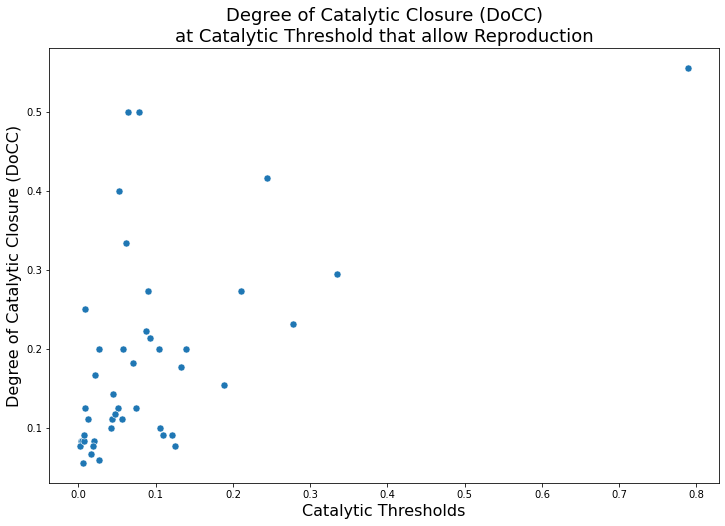

In [266]:
nmol = True
percent_gap = 0.0005
thresholds = []

'''All betas'''
beta_matrices_singles_values_all_list = []
for beta in range(1,101):
    if beta not in betas:
        continue
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    beta_matrix_values_list_temp = df_beta_matrix.values.tolist()
    beta_matrix_values_list = []
    for temp_list in beta_matrix_values_list_temp:
        for val in temp_list:
            if val != 0:
                beta_matrix_values_list.append(val)
    del beta_matrix_values_list_temp
    beta_matrices_singles_values_all_list.extend(beta_matrix_values_list)

beta_matrices_singles_values_all_array = np.array(beta_matrices_singles_values_all_list)
beta_matrices_singles_values_all_array = np.log(beta_matrices_singles_values_all_array)

# all_betas_list = sorted(list(beta_matrices_values_all_list_array))
all_betas_list = sorted(list(beta_matrices_singles_values_all_array))

amount_gap = int(percent_gap*(len(all_betas_list) / 100))
sections_num = int(np.floor(100/percent_gap))
base = len(all_betas_list)
for jump in range(1,sections_num+1):
    val_at_cutoff = all_betas_list[base-amount_gap]
#     print(base,val_at_cutoff)
    base -= amount_gap
    thresholds.append(val_at_cutoff)
thresholds = np.exp(thresholds)

reproduction_threshold_list = []
docc_list = []
for beta in range(1,101):
    if beta not in betas:
        continue
    print(beta)
    compotype = np.array(df_compotypes.loc[:,str(beta)])
    if nmol:
        compotype_bool = nmol_transform(compotype)
        nmol_idxs = [counter for counter,value in enumerate(compotype_bool) if value == 1]
        compotype = [compotype[counter] for counter in nmol_idxs]
    compotype = [x/sum(compotype) for x in compotype]
    df_beta_matrix = pd.read_csv("C:\\Users\\amitka\Box Sync\B-OOLf\Pap425 Attractor\AAA Pap425 simulations\GARD Simulation Project AK\All betas\Beta " + str(beta) + ".csv", header=None)
    if nmol:
        df_beta_matrix_nmol = df_beta_matrix.loc[nmol_idxs,nmol_idxs]
    for threshold_counter, threshold in enumerate(thresholds):
        # interaction = (column,row)
        if nmol:
            df_beta_matrix_nmol_mod = deepcopy(df_beta_matrix_nmol)
        else:
            df_beta_matrix_nmol_mod = deepcopy(df_beta_matrix)
        df_beta_matrix_nmol_mod[df_beta_matrix_nmol_mod < threshold] = 0
        flux = flux_calc(df_beta_matrix_nmol_mod,compotype)
#         hval = H_solver(compotype,flux)
        hval = 1-distance.cosine(compotype,flux)
        if hval >= 0.9:
#             print(hval, flux, compotype)
            '''reproduction'''
            reproduction_threshold = round((percent_gap)*(1+threshold_counter),5)
            reproduction_threshold_list.append(reproduction_threshold)
            '''closure'''
#             display(df_beta_matrix_nmol_mod)
            columns_list = list(df_beta_matrix_nmol_mod.columns)
            columns_set = set(columns_list)
            columns_perm = list(permutations(columns_list, 2))
            same_columns_list = [(x,x) for x in columns_list]
            columns_perm.extend(same_columns_list)
            available_interactions_rows_set = set([y for x,y in columns_perm if df_beta_matrix_nmol_mod.loc[y,x] >= threshold])
            docc = len(list(available_interactions_rows_set)) / len(columns_list)
#             print(docc,list(available_interactions_rows_set),columns_list)
            docc_list.append(docc)
            print(threshold_counter,reproduction_threshold,docc)
            break
    else:
        print('sorry')

fig,ax = plt.subplots(figsize=(12,8))
sns.scatterplot(reproduction_threshold_list,docc_list,s=50)
plt.title("Degree of Catalytic Closure (DoCC)\nat Catalytic Threshold that allow Reproduction", fontsize=18)
plt.xlabel("Catalytic Thresholds", fontsize=16)
plt.ylabel("Degree of Catalytic Closure (DoCC)", fontsize=16)